# Pipeline for AGEP column

Enable auto-reloading of external modules

In [66]:
import pandas as pd
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import dependencies

In [67]:
from pprint import pprint

from utils.data_loader import *
from utils.null_handler import *
from utils.EDA_utils import *
from utils.simple_utils import *
from utils.model_tuning_utils import *
from utils.stability_analysis import *
from utils.analysis_helper import *
from config import *

import os
import warnings
warnings.filterwarnings('ignore')
os.environ["PYTHONWARNINGS"] = "ignore"

plt.style.use('mpl20')
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams.update({'font.size': 10})

In [68]:
try:
    from folktables import ACSDataSource, ACSEmployment
except:
    !pip install folktables
    from folktables import ACSDataSource, ACSEmployment

## Loading ACSEmployment data

In [69]:
TARGET_COLUMN = 'AGEP'
NULL_SCENARIO_NAME = f'Unknown_{TARGET_COLUMN}'
COLUMN_TYPE = get_column_type(TARGET_COLUMN)

In [70]:
X_data, y_data = ACSDataLoader(task=DATASET_CONFIG['task'], state=DATASET_CONFIG['state'], year=DATASET_CONFIG['year'], without_nulls=True)

Original: 24 mb
Optimized: 12 mb

Dataset shape before handling nulls:  (196967, 16)
Impute values:  {'SCHL': 0, 'ESP': 0, 'MIG': 0, 'MIL': 0, 'DREM': 0}
Dataset shape after handling nulls:  (196967, 16)

Rechecking if there are nulls in X_data:
AGEP        0
SCHL        0
MAR         0
RELP        0
DIS         0
ESP         0
CIT         0
MIG         0
MIL         0
ANC         0
NATIVITY    0
DEAR        0
DEYE        0
DREM        0
SEX         0
RAC1P       0
dtype: int64


In [71]:
y_data.value_counts()

0    105498
1     91469
Name: ESR, dtype: int64

## Tune hyper-parameters and find the best model

### The best model for a baseline dataset (no nulls)

In [72]:
ML_baseline_results_df = pd.read_csv(os.path.join('..', 'results', 'ML_baseline_results_df.csv'))
ML_baseline_results_df

,Unnamed: 0,Dataset_Name,Model_Name,F1_Score,Accuracy_Score,Model_Best_Params
0,0,Folktables [NY 2018],LogisticRegression,0.7998,0.7999,"{'max_iter': 100, 'penalty': 'l2', 'solver': '..."
1,1,Folktables [NY 2018],DecisionTreeClassifier,0.8229,0.8230,"{'criterion': 'entropy', 'max_depth': 10, 'max..."
2,2,Folktables [NY 2018],XGBClassifier,0.8296,0.8297,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti..."


### Find the best model for a drop-column dataset (with nulls)

In [73]:
# import time
# start = time.time()

In [74]:
# # TODO: tune XGBoost just for one pipeline, not for all. Avoid Xgboost for other pipelines to reduce time
#
# # Copy datasets for tuning to avoid confusion with datasets for imputations
# baseline_X_data, baseline_y_data = X_data.copy(deep=True), y_data.copy(deep=True)
# baseline_X_data.drop(columns=[TARGET_COLUMN], axis=1, inplace=True)
# baseline_X_train_features, baseline_y_train, baseline_X_test_features, baseline_y_test = preprocess_dataset(X_data, y_data)
#
# ML_drop_column_results_df = test_models(baseline_X_train_features, baseline_y_train, baseline_X_test_features, baseline_y_test)
# ML_drop_column_results_df

In [75]:
# for index, row in ML_drop_column_results_df.iterrows():
#     print(f'\n\nModel name: {row["Model_Name"]}')
#     pprint(row['Model_Best_Params'])

In [76]:
# ML_drop_column_results_df.to_csv(os.path.join('..', 'results', NULL_SCENARIO_NAME, f'{NULL_SCENARIO_NAME}_ML_drop_column_results_df.csv'),
#                                  sep=",", columns=ML_drop_column_results_df.columns, float_format="%.4f")

In [77]:
# end = time.time()
# print('Model tuning time: ', end - start)

## Simulate Null Scenarios

In [78]:
corrupted_data = simulate_scenario(X_data, SIMULATED_SCENARIOS_DICT[NULL_SCENARIO_NAME])

## Impute Nulls

Check correctness of conditional techniques

In [79]:
mapping_dict = check_conditional_techniques(corrupted_data, TARGET_COLUMN)
pprint(mapping_dict)

{'RAC1P': {'RAC1P-1': (2271, 'AGEP-60.0'),
           'RAC1P-2': (436, 'AGEP-19.0'),
           'RAC1P-3': (16, 'AGEP-17.0'),
           'RAC1P-4': (1, 'AGEP-27.0'),
           'RAC1P-5': (10, 'AGEP-52.0'),
           'RAC1P-6': (299, 'AGEP-45.0'),
           'RAC1P-7': (7, 'AGEP-29.0'),
           'RAC1P-8': (213, 'AGEP-17.0'),
           'RAC1P-9': (143, 'AGEP-1.0')},
 'SEX': {'SEX-1': (1468, 'AGEP-19.0'), 'SEX-2': (1627, 'AGEP-60.0')}}


Impute a null scenario with all null-handling techniques

In [80]:
# TODO: use enable_plots=True just for one pipeline, but for others set False
imputed_data_dict, technique_metrics_dict = impute_df_with_all_techniques(X_data, corrupted_data,
                                                                          TARGET_COLUMN, COLUMN_TYPE, NULL_SCENARIO_NAME, enable_plots=False)
imputed_data_dict['baseline'] = X_data





 ###############  Impute AGEP column with drop-column technique  ###############




 ###############  Impute AGEP column with drop-rows technique  ###############




 ###############  Impute AGEP column with predict-by-sklearn technique  ###############
MAE for regression - AGEP: 26.0




 ###############  Impute AGEP column with kNN technique  ###############
MAE for regression - AGEP: 9.4




 ###############  Impute AGEP column with regression technique  ###############
MAE for regression - AGEP: 10.8




 ###############  Impute AGEP column with impute-by-mean technique  ###############
Impute values:  {'AGEP': 42.0}
MAE for regression - AGEP: 19.2




 ###############  Impute AGEP column with impute-by-mean-trimmed technique  ###############
Impute values:  {'AGEP': 42.0}
MAE for regression - AGEP: 19.2




 ###############  Impute AGEP column with impute-by-mean-conditional technique  ###############
Impute AGEP with value 41.0, where SEX == 1
Impute AGEP with value 43.0, w

In [81]:
print("#" * 15, " Metrics for different imputation techniques ", "#" * 15)
for technique_name in technique_metrics_dict:
    print(f'{technique_name}: {round(technique_metrics_dict[technique_name], 4)}')

###############  Metrics for different imputation techniques  ###############
kNN: 9.3847
regression: 10.841
impute-by-mean-conditional_RAC1P: 18.8052
impute-by-median-conditional_RAC1P: 19.0725
impute-by-mean-conditional_SEX: 19.1549
impute-by-mean: 19.1805
impute-by-mean-trimmed: 19.1805
impute-by-median: 19.1805
impute-by-median-trimmed: 19.1805
impute-by-median-conditional_SEX: 19.303
predict-by-sklearn: 26.03


## Quantifying uncertainty using posterior predictive distribution

In [82]:
matplotlib.rcParams.update({'font.size': 14})
imputation_techniques = list(imputed_data_dict.keys())
imputation_techniques

['drop-column',
 'drop-rows',
 'predict-by-sklearn',
 'kNN',
 'regression',
 'impute-by-mean',
 'impute-by-mean-trimmed',
 'impute-by-mean-conditional_SEX',
 'impute-by-mean-conditional_RAC1P',
 'impute-by-median',
 'impute-by-median-trimmed',
 'impute-by-median-conditional_SEX',
 'impute-by-median-conditional_RAC1P',
 'baseline']

### Plots notes

Notes is based on [this paper](https://www.osti.gov/servlets/purl/1527311).

**Probability mean vs Standard deviation**
* The closer a sample is to the decision boundary, the more likely that small changes in the input data or parameters will change the predicted class.
* To gain a general understanding about the relative instability of individual classifications, we calculate the absolute difference between the number of times a sample is classified as employed or not employed and call this calculation **label stability**.
* When a sample is close to the boundary of a decision surface, perturbations in the data often cause the classifiers' to label the sample differently. Identifying which samples fall into this range, allows us to measure the relative stability of an individual classification.


**Standard deviation vs Label stability and Probability mean vs Label stability**
* Shows the correlation between probability mean, standard deviation and label stability.
* Label stability is defined as the absolute difference between the number of times the sample is classified as 0 and 1.
    * If the absolute difference is large, the label is more stable
    * If the difference is exactly zero then it's extremely unstable --- equally likely to be classified as 0 or 1


**Accuracy vs Standard deviation**
* When it is given the same label with a probability of 100%, each tree's classification of a sample is a binary decision. With 100 trees, each giving 100% probability to its prediction, the calculations of mean and standard deviation can **only result in certain values.** In this case the plot should have a shape of an arc, like here:

![image](https://user-images.githubusercontent.com/42843889/180245566-2312a79d-977f-4a56-89ac-1404c807b80e.png)

* For example for KNN based on this kind of plot, we can notice that as the number of neighbors increase, the stability of the classifiers increases, so there are lower standard deviation values. The standard deviation values show less correlation to accuracy as the number of neighbors increases. The overall accuracy is also decreased suggesting that the models are underfitting the training data.


**Accuracy vs Interquartile range**
* The interquartile range provides a measure of variability as the difference between the third and first quartiles.


### Baseline technique

TODO:add colors to plots(use RACE_SEX from test_groups, add technical column to df before plotting):
* light blue color: advantaged_RACE_disadvataged_SEX
* dark blue color: advantaged_RACE_advataged_SEX
* light red color: disadvantaged_RACE_disadvataged_SEX
* dark red color: disadvantaged_RACE_advataged_SEX

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


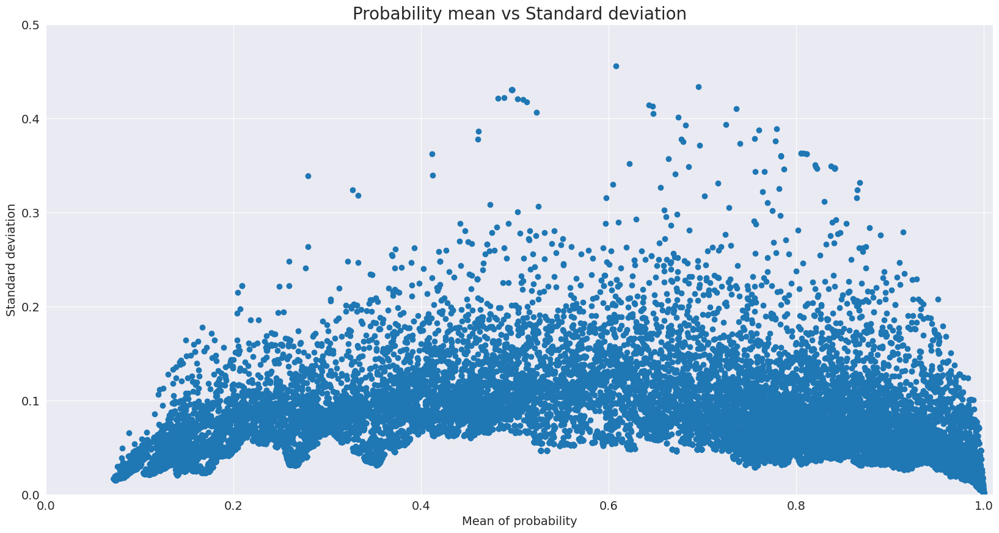

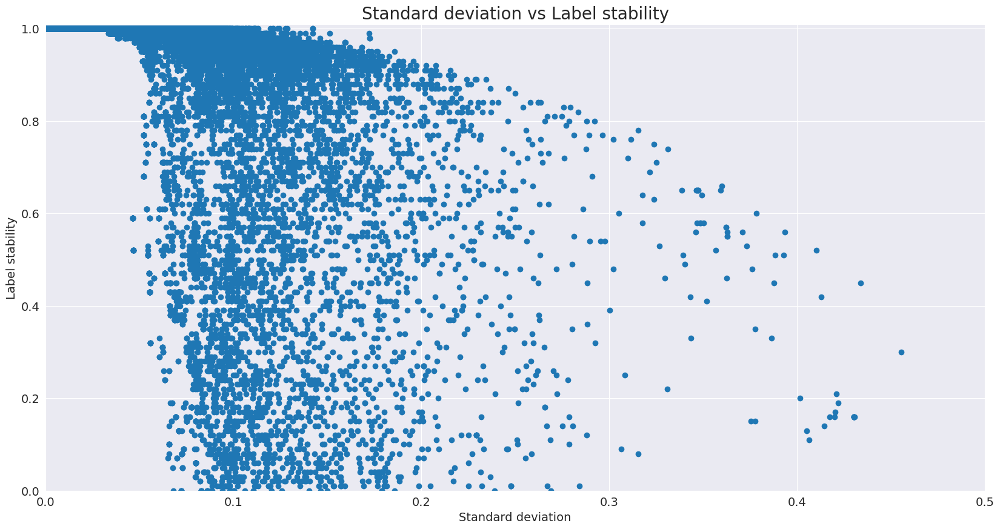

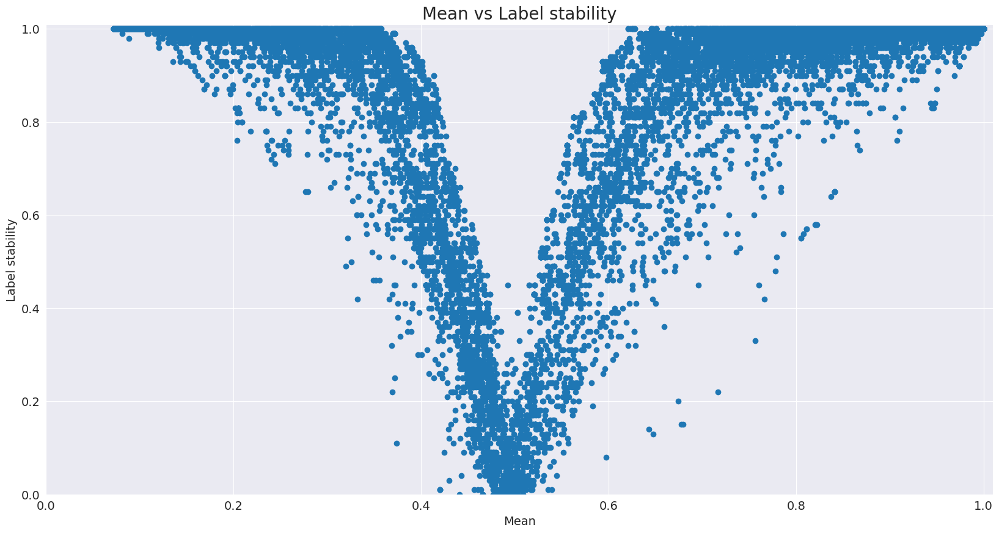

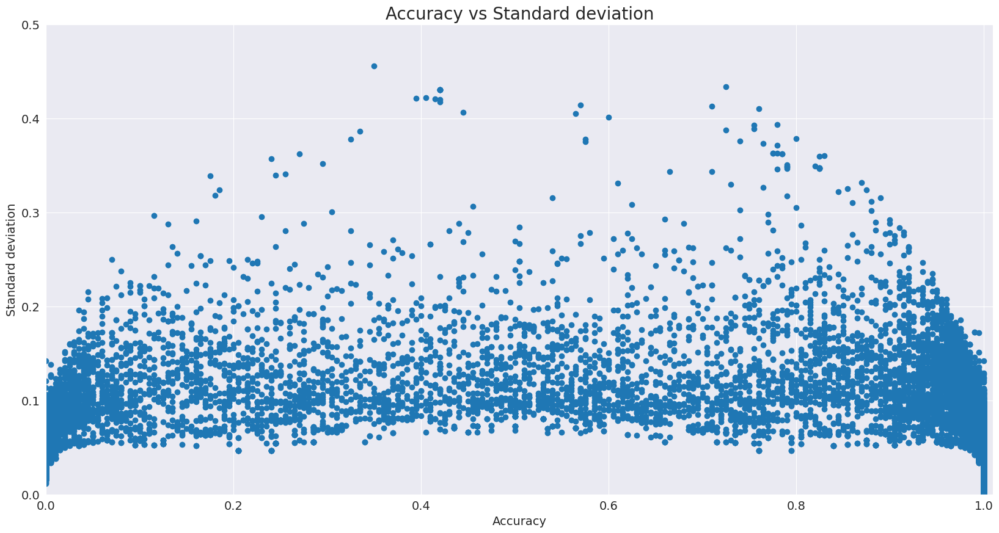

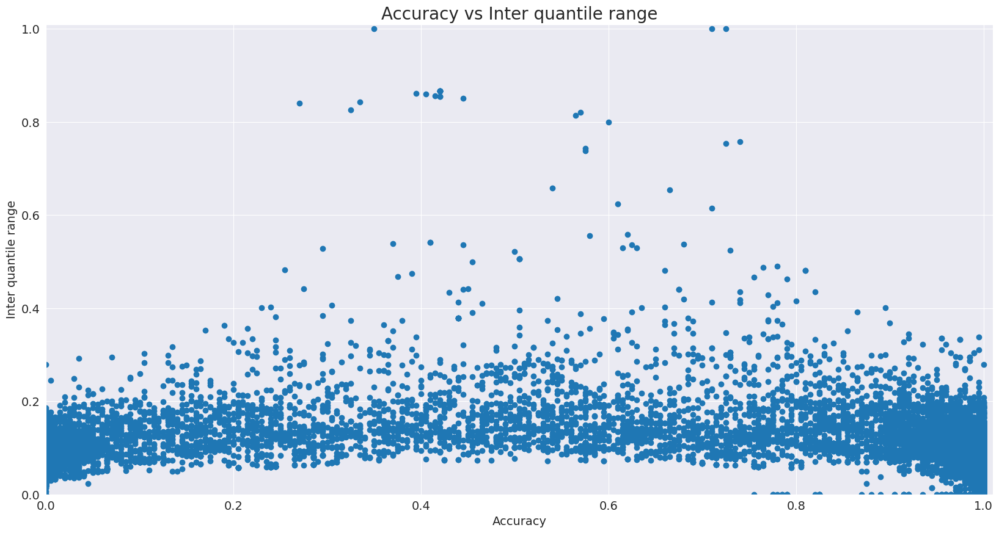

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.828675  0.845027  0.842824
disadv    0.824498  0.808500  0.804858
Accuracy  0.004177  0.036526  0.037966

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.516266  0.519214  0.523377
disadv            0.489312  0.518533  0.519838
Disparate_Impact  0.947789  0.998689  0.993238

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.863479  0.873999  0.863596
disadv             0.869960  0.868558  0.864545
Equal_Opportunity -0.006481  0.005441 -0.000949

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.088022  1.066248  1.039308
disadv             

In [83]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='baseline')

### Drop-column technique

X_train_imputed.shape:  (157573, 73)
X_test_imputed.shape:  (39394, 73)


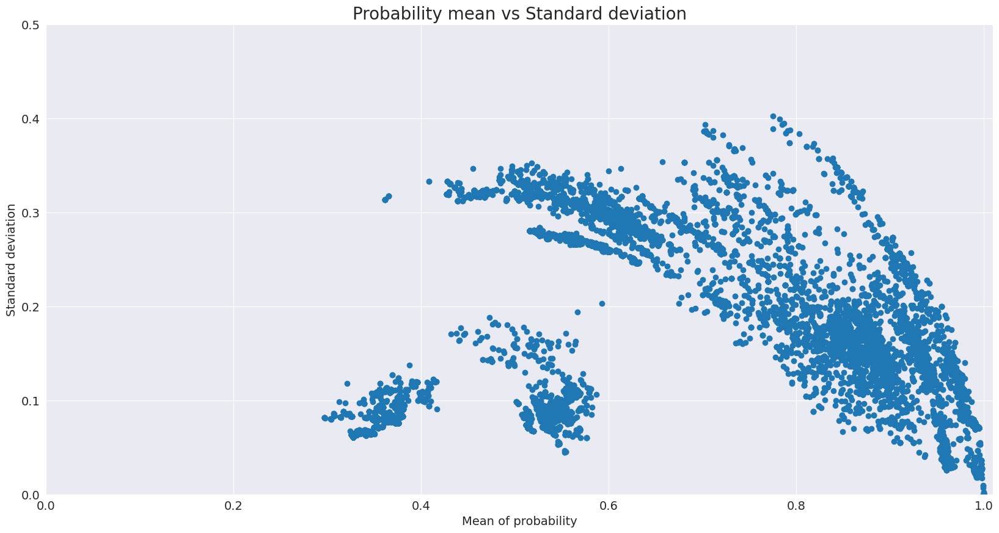

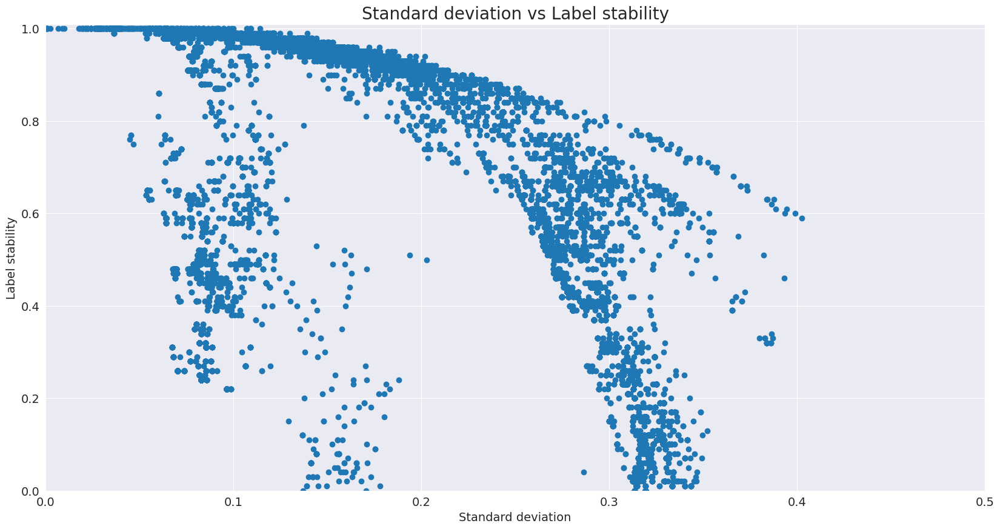

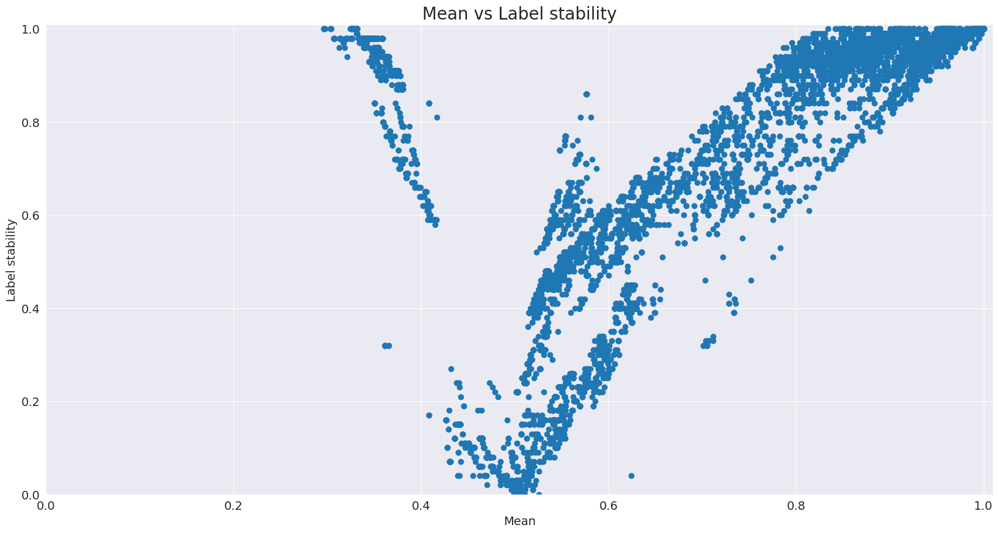

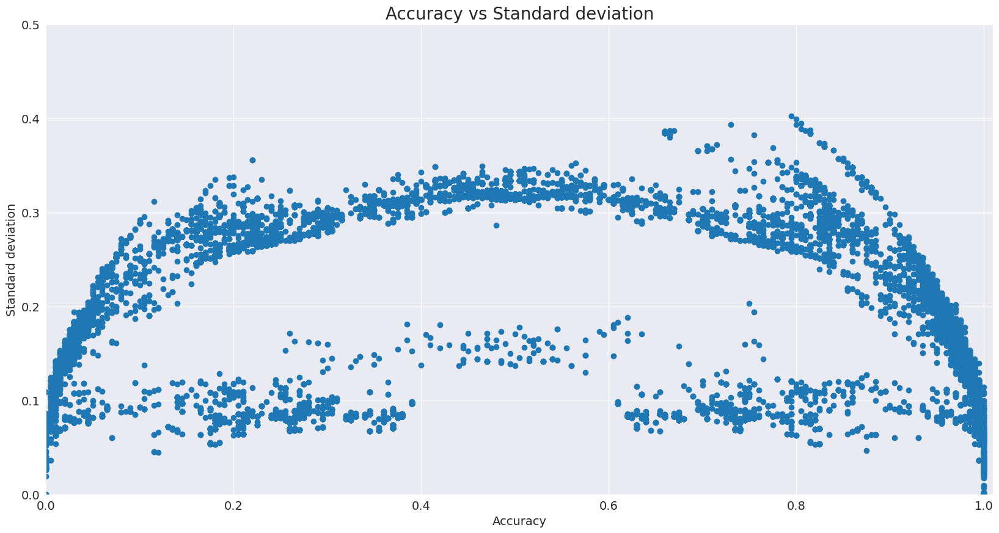

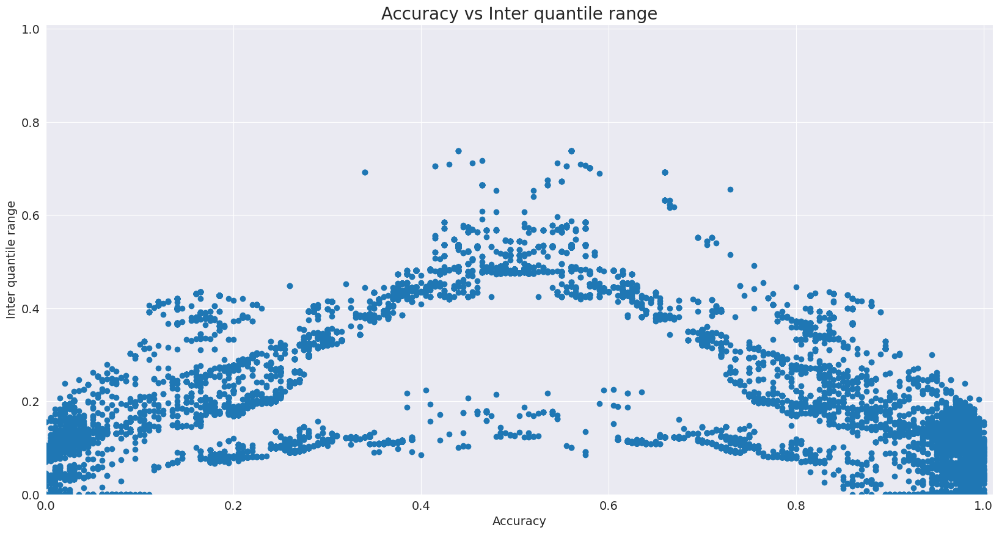

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.579269  0.639683  0.601153
disadv    0.623916  0.560566  0.563559
Accuracy -0.044647  0.079117  0.037593

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.105355  0.272326  0.215162
disadv            0.135688  0.000000  0.000000
Disparate_Impact  1.287915  0.000000  0.000000

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.165682  0.409801  0.317367
disadv             0.210448  0.000000  0.000000
Equal_Opportunity -0.044765  0.409801  0.317367

#################### Statistical_Parity_Difference ####################
                                   Race      Sex  Race_Sex
adv                            0.223364  0.55832  0.427858
disadv               

In [84]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='drop-column')

### Drop-rows technique

X_train_imputed.shape:  (155224, 74)
X_test_imputed.shape:  (38806, 74)


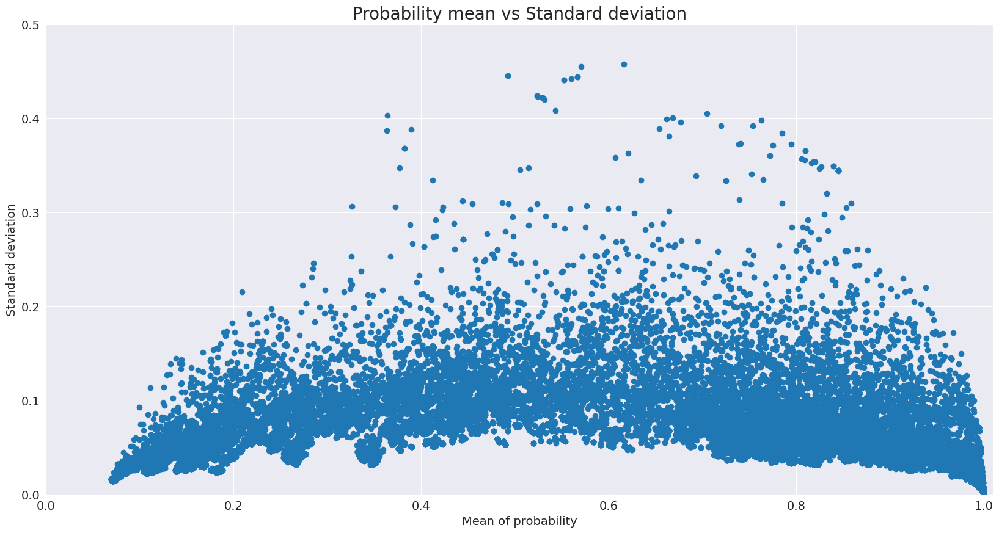

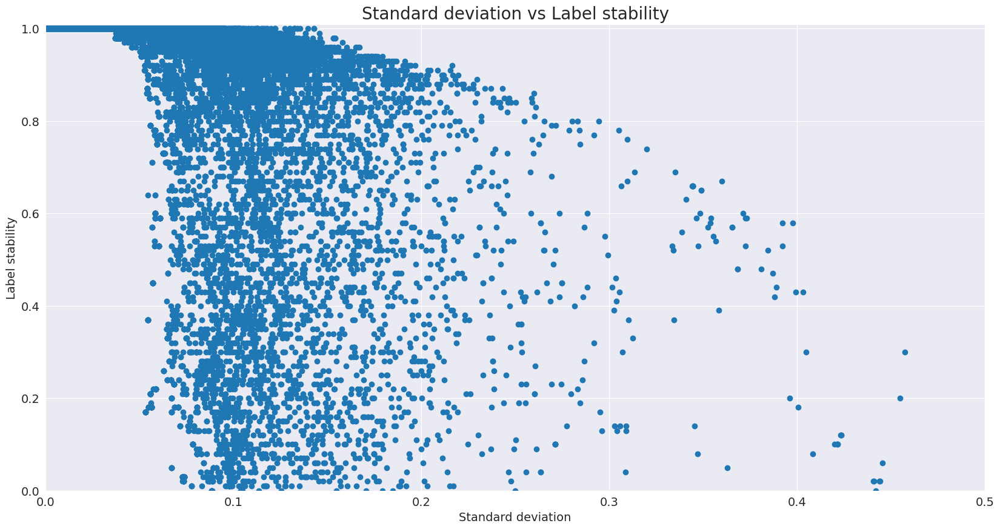

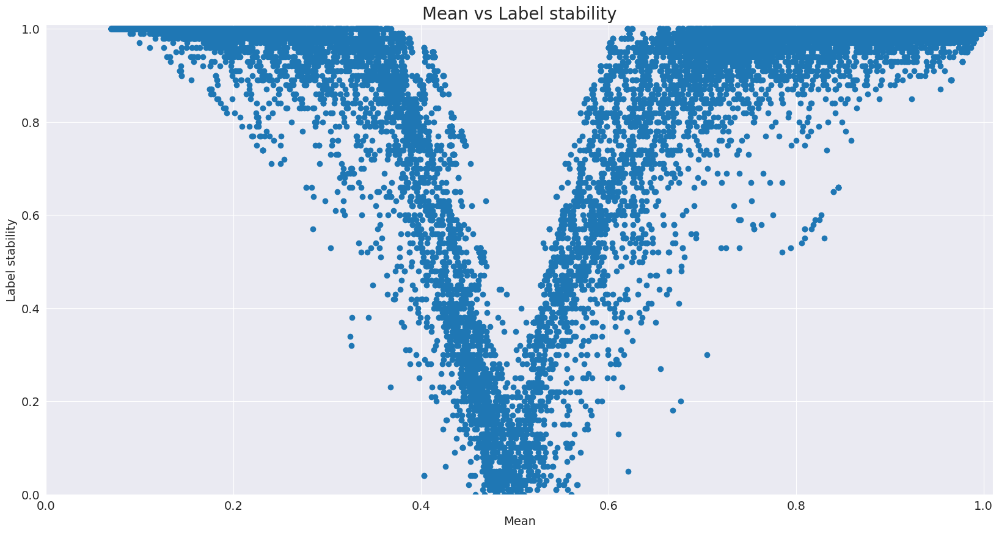

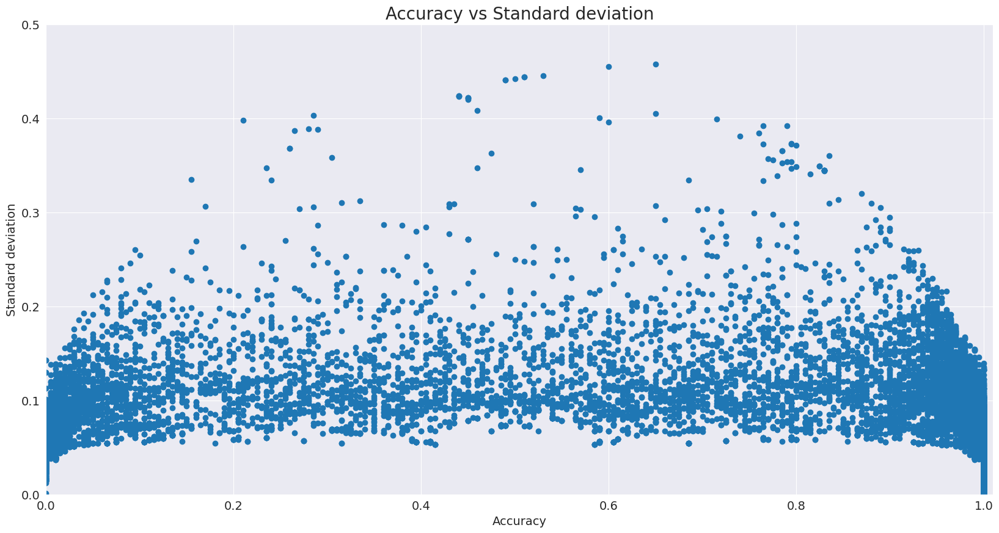

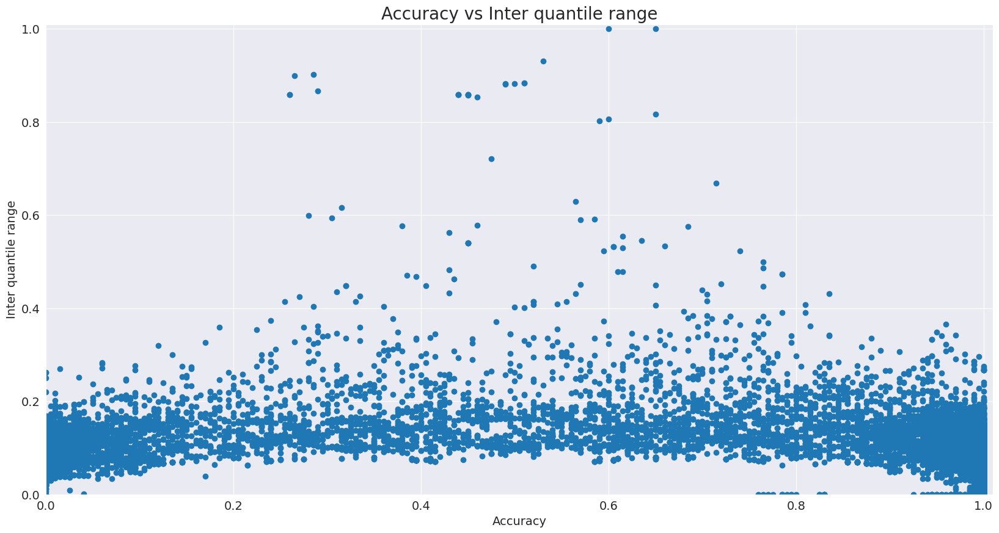

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.831033  0.846809  0.848537
disadv    0.814910  0.806955  0.799763
Accuracy  0.016123  0.039854  0.048774

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.513039  0.520722  0.520630
disadv            0.497858  0.513959  0.511058
Disparate_Impact  0.970408  0.987013  0.981615

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.864430  0.879562  0.869944
disadv             0.867203  0.862108  0.854824
Equal_Opportunity -0.002773  0.017454  0.015120

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.086789  1.075536  1.043452
disadv             

In [85]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='drop-rows')

### Predict-by-sklearn technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


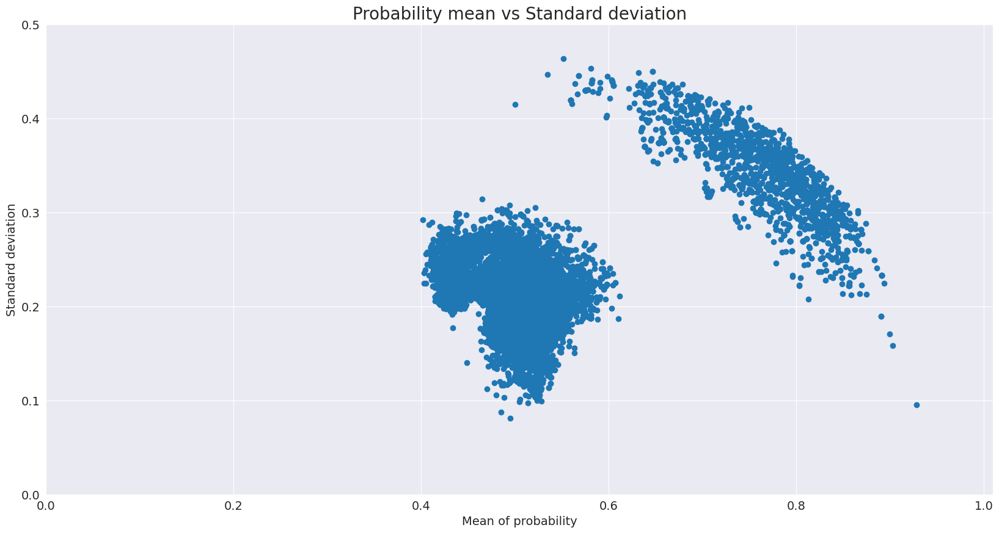

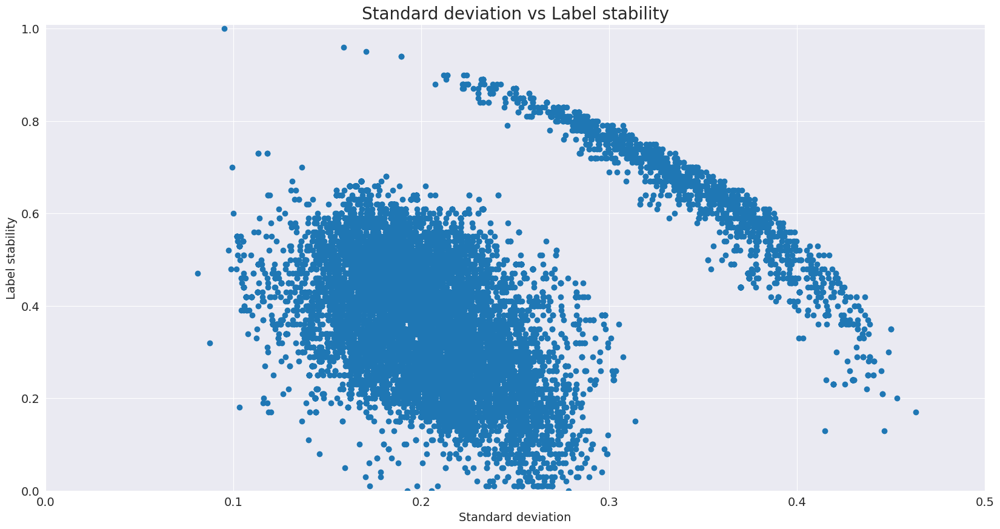

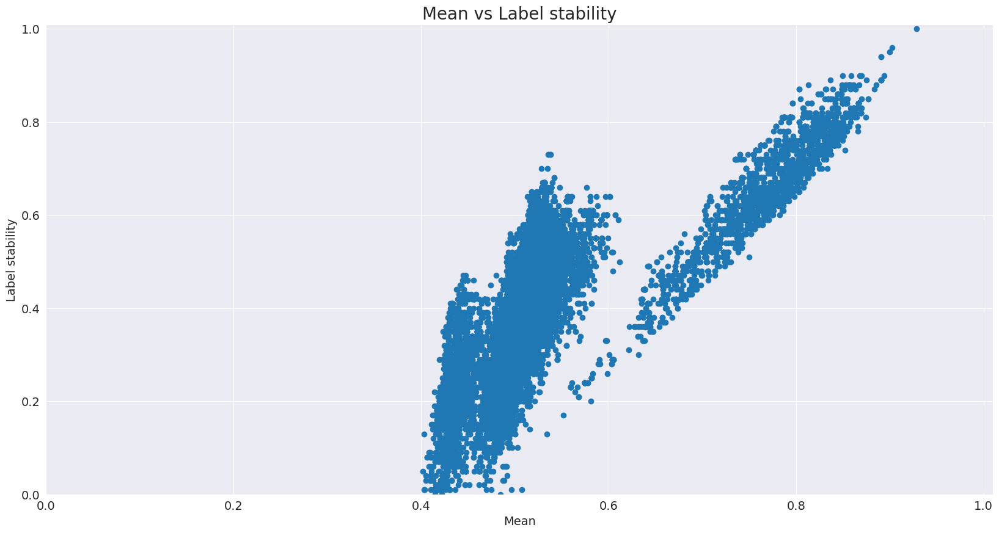

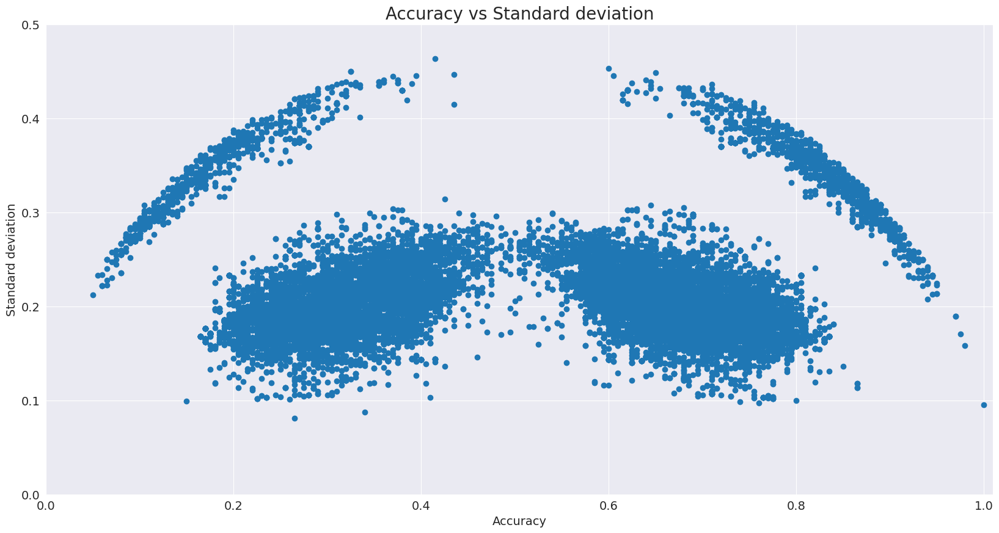

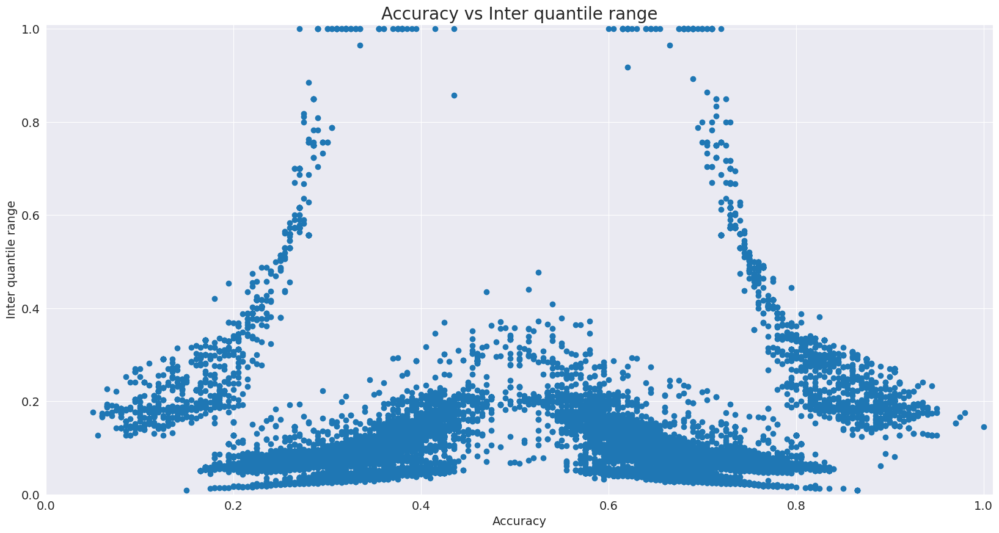

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.519284  0.514079       NaN
disadv    0.516522  0.516062       NaN
Accuracy  0.002762 -0.001984       NaN

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.368741  0.464593       NaN
disadv            0.385791  0.363936       NaN
Disparate_Impact  1.046239  0.783342       NaN

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.380160  0.477098       NaN
disadv             0.392549  0.370535       NaN
Equal_Opportunity -0.012389  0.106563       NaN

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.789282  0.997744       NaN
disadv             

In [86]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='predict-by-sklearn')

### kNN imputation technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


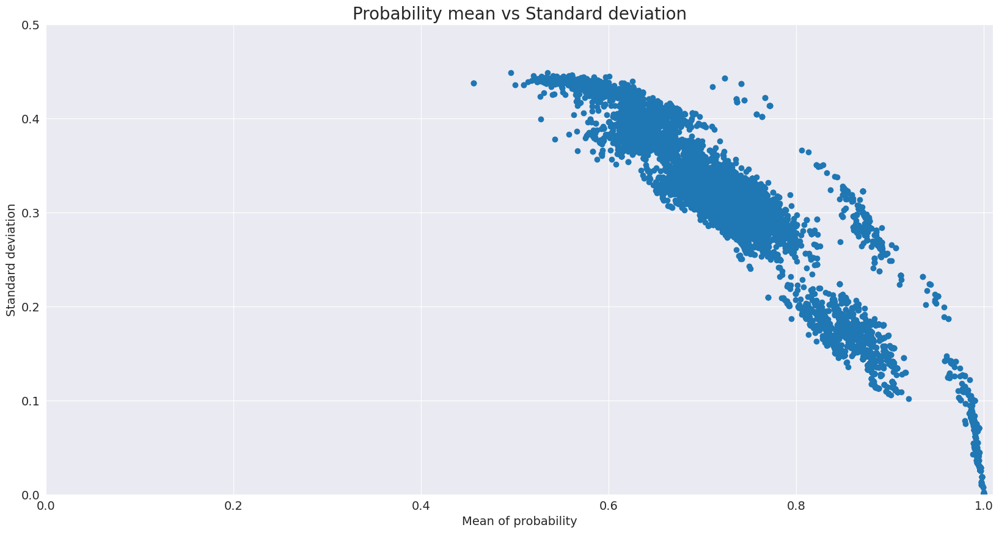

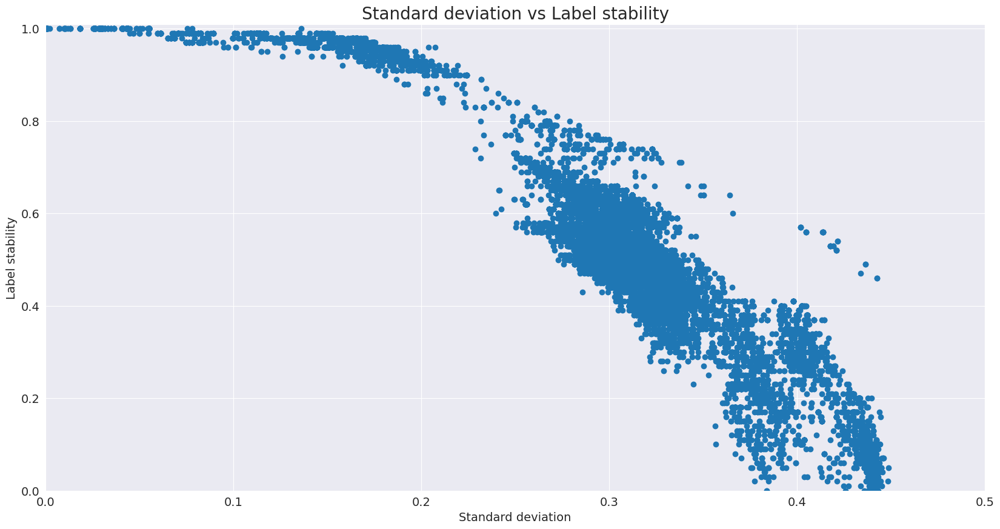

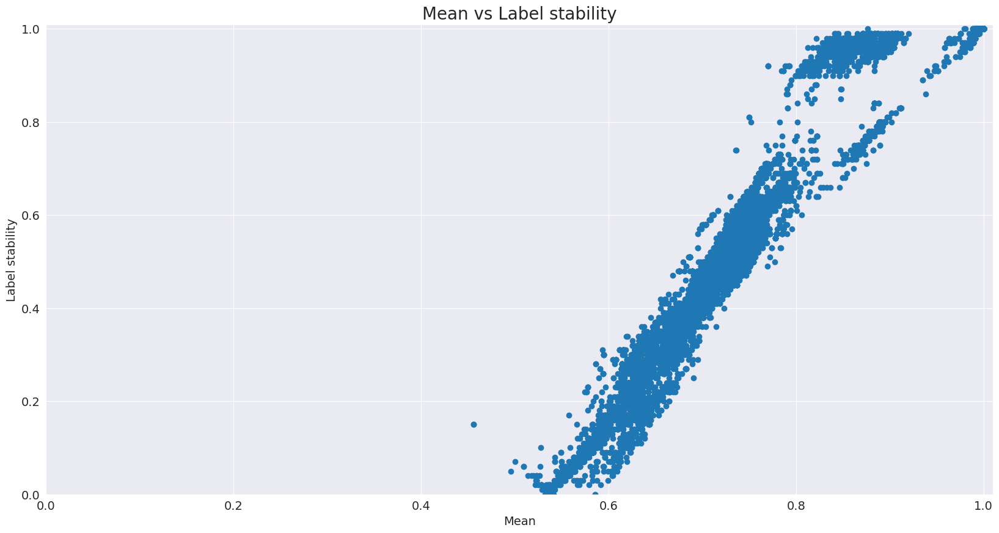

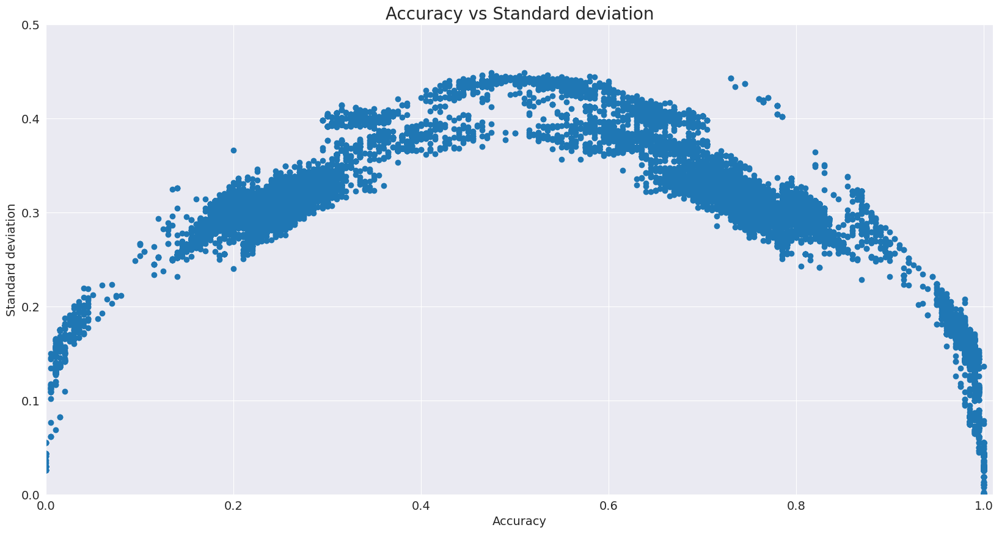

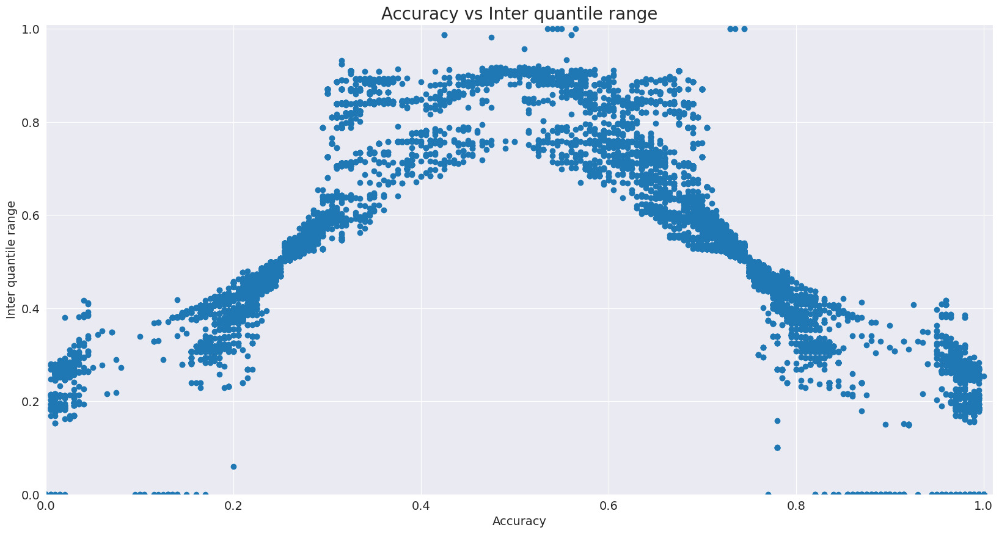

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.528220  0.512240  0.497118
disadv    0.584882  0.560419  0.563559
Accuracy -0.056662 -0.048179 -0.066441

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000109  0.000000       0.0
disadv            0.000000  0.000147       0.0
Disparate_Impact  0.000000       inf       NaN

#################### Equal_Opportunity ####################
                   Race  Sex  Race_Sex
adv                 0.0  0.0       0.0
disadv              0.0  0.0       0.0
Equal_Opportunity   0.0  0.0       0.0

#################### Statistical_Parity_Difference ####################
                                  Race       Sex  Race_Sex
adv                            0.00023  0.000000       0.0
disadv                         0.00000  0.000335       0.

In [87]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='kNN')

### Regression imputation technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


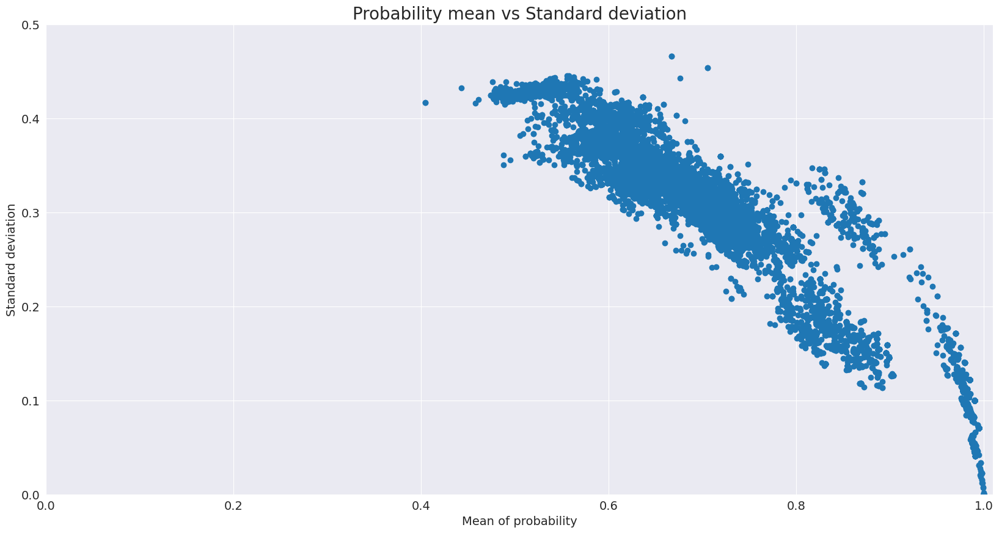

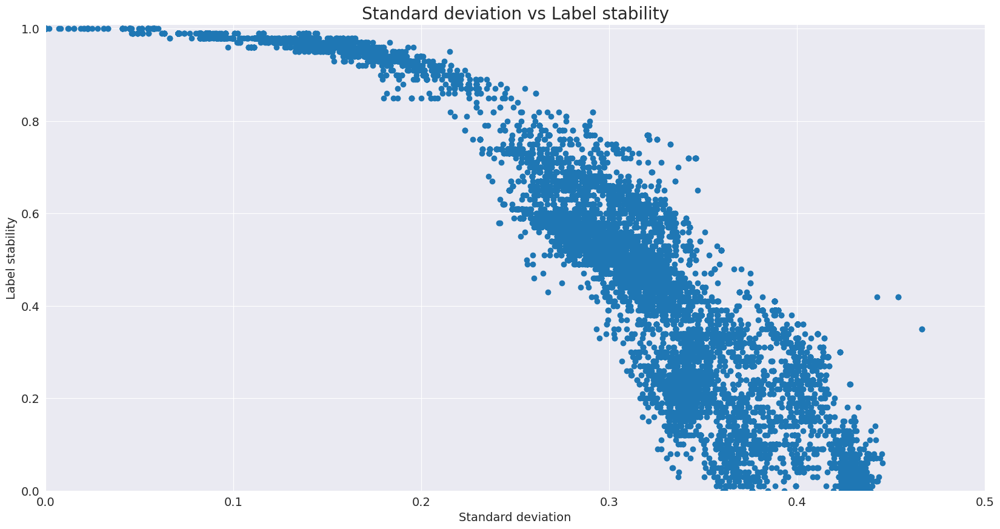

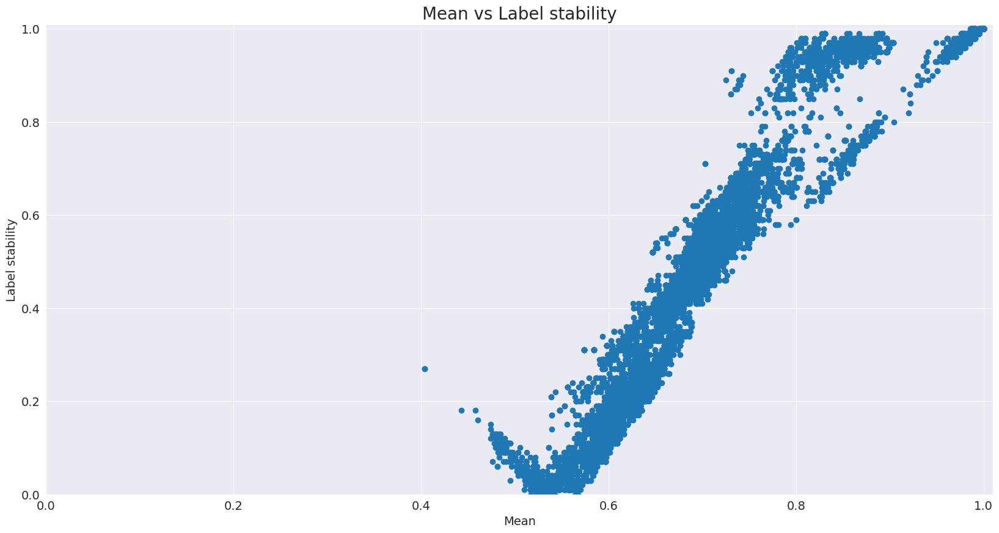

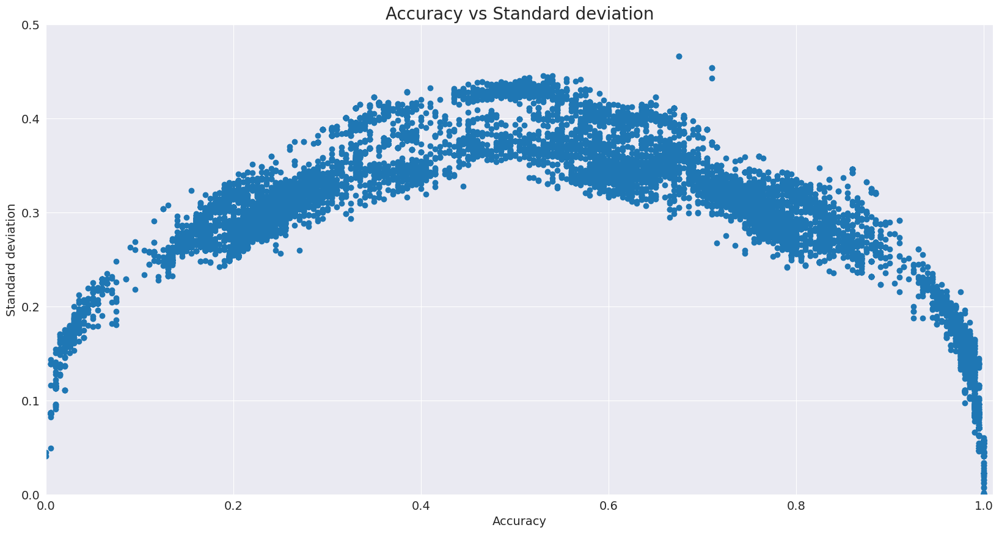

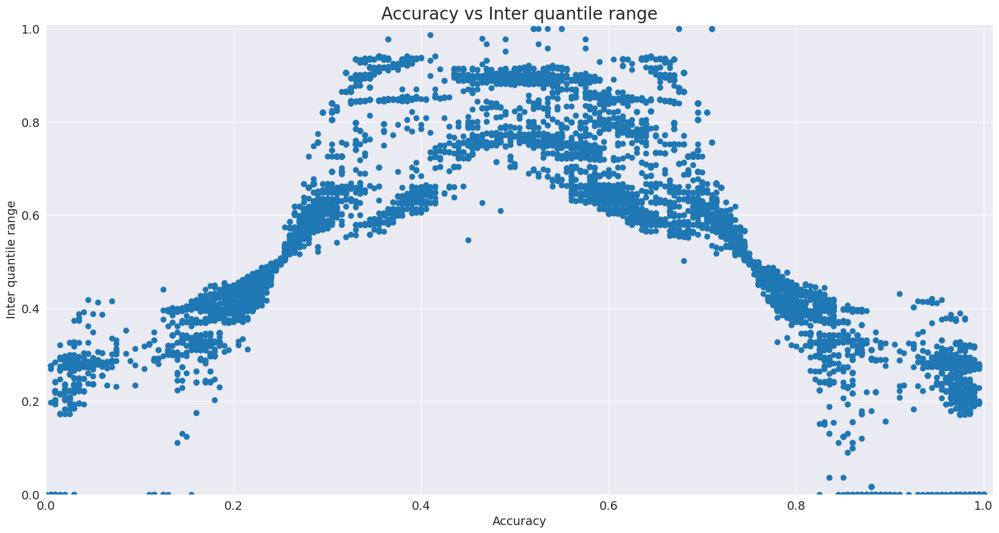

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.526954  0.510979  0.495936
disadv    0.584056  0.559141  0.562018
Accuracy -0.057102 -0.048162 -0.066082

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.002315  0.002942  0.002512
disadv            0.000826  0.002603  0.001541
Disparate_Impact  0.356774  0.884970  0.613342

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.000997  0.001723  0.001322
disadv             0.000000  0.001341  0.000000
Equal_Opportunity  0.000997  0.000382  0.001322

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.004909  0.006031  0.004996
disadv             

In [88]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='regression')

### Impute-by-mean technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


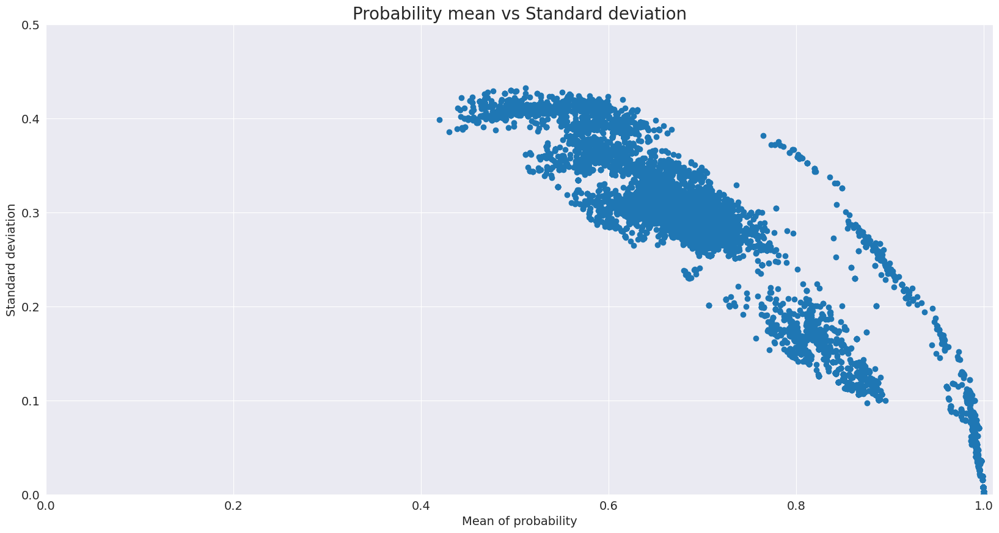

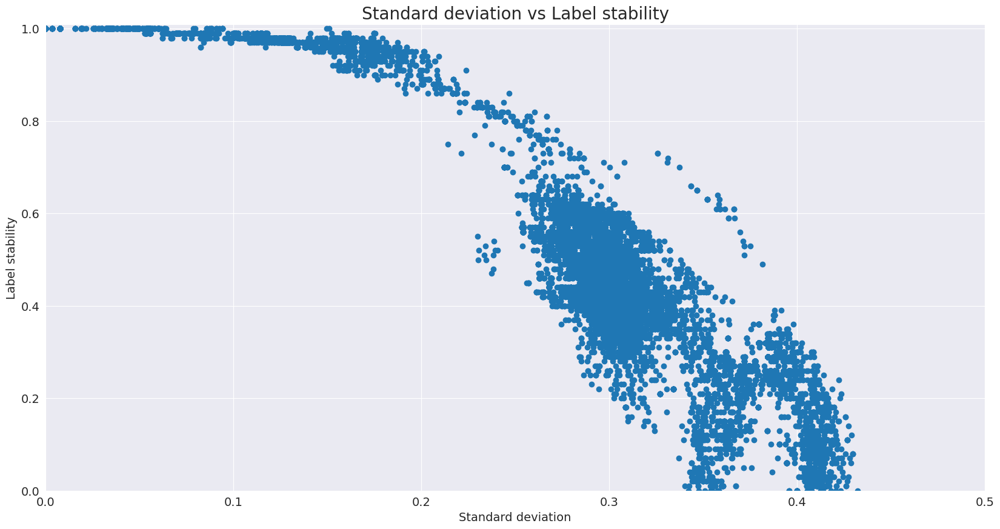

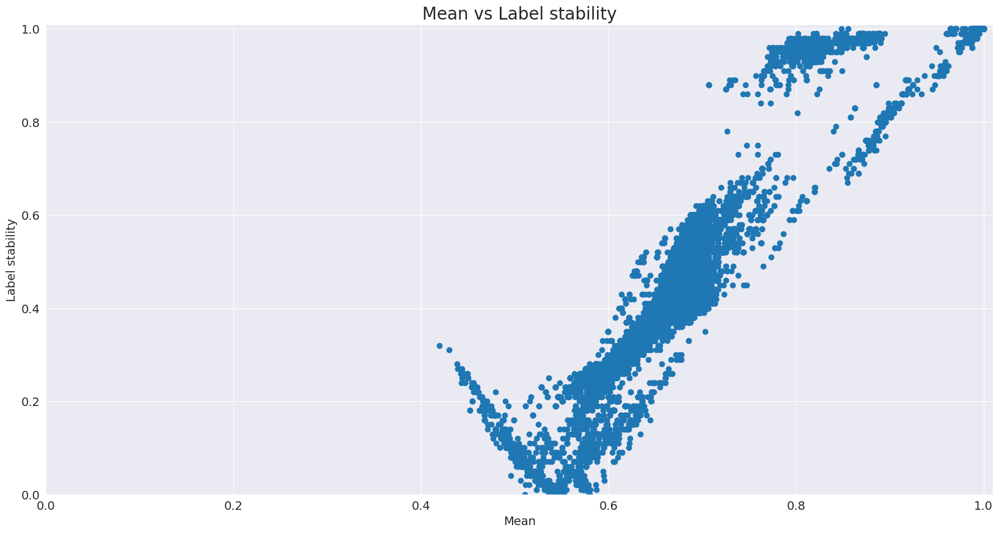

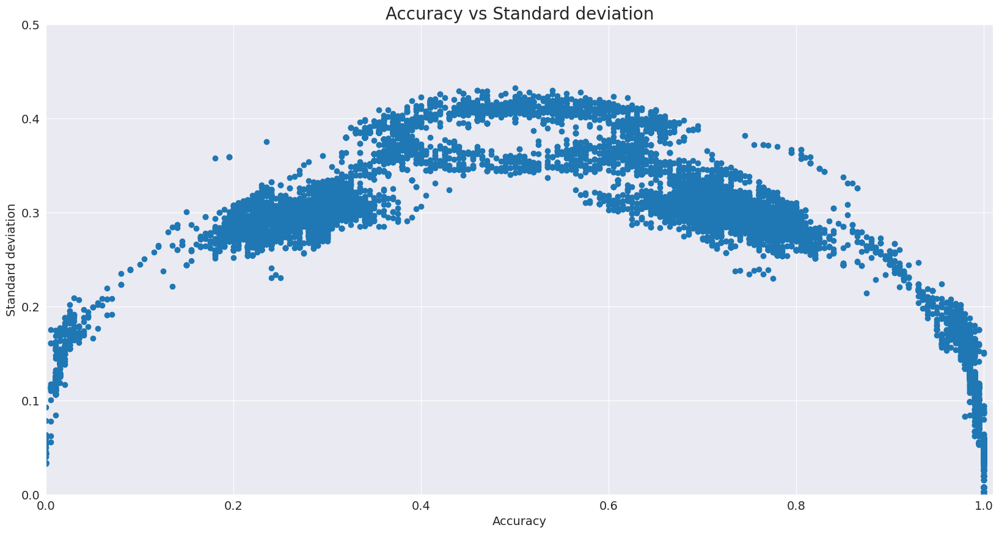

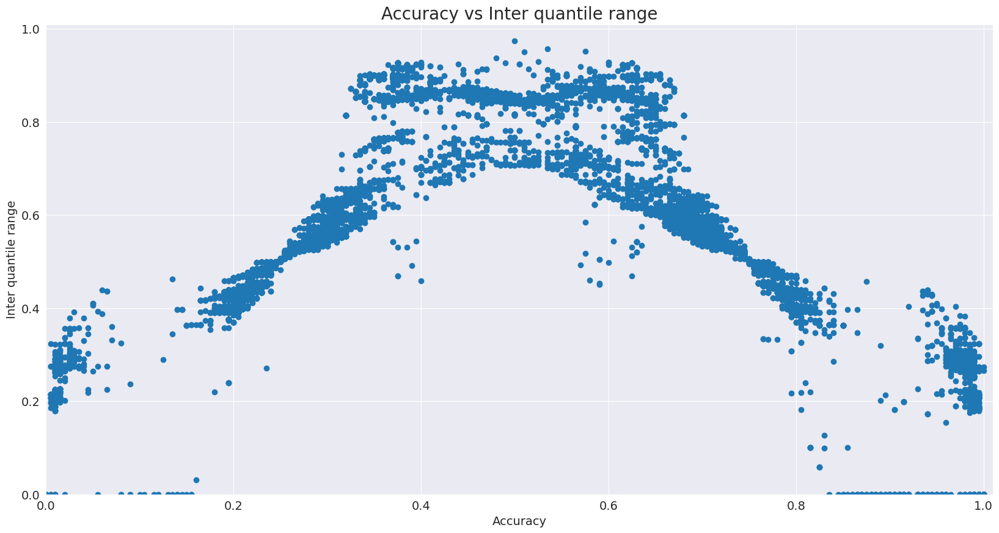

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.523408  0.508037  0.491872
disadv    0.584263  0.556980  0.562789
Accuracy -0.060855 -0.048943 -0.070917

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.013169  0.013028  0.015886
disadv            0.002685  0.009087  0.003852
Disparate_Impact  0.203871  0.697526  0.242484

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.008744  0.009047  0.010579
disadv             0.002488  0.006260  0.003530
Equal_Opportunity  0.006257  0.002787  0.007048

#################### Statistical_Parity_Difference ####################
                                   Race      Sex  Race_Sex
adv                            0.027921  0.02671  0.031590
disadv               

In [89]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean')

### Impute-by-mean-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


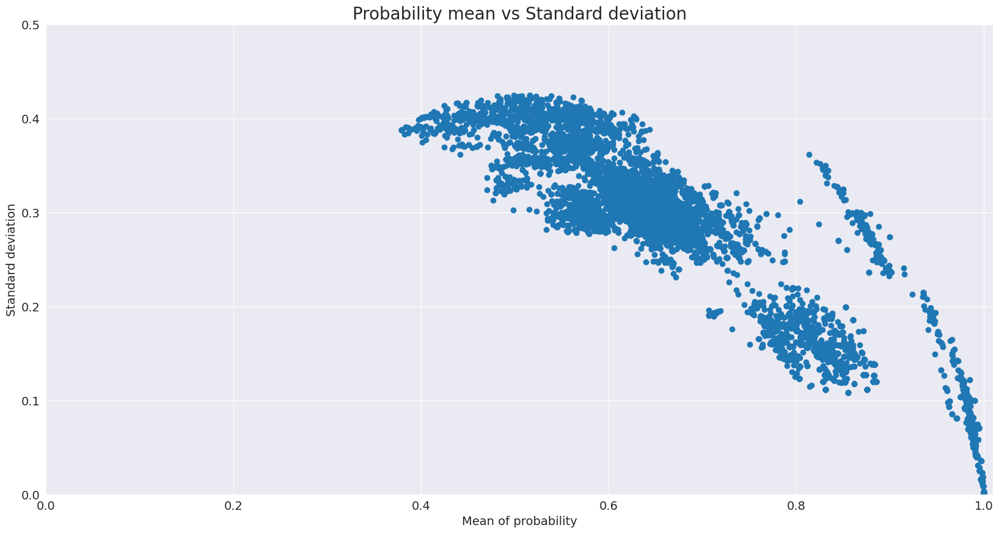

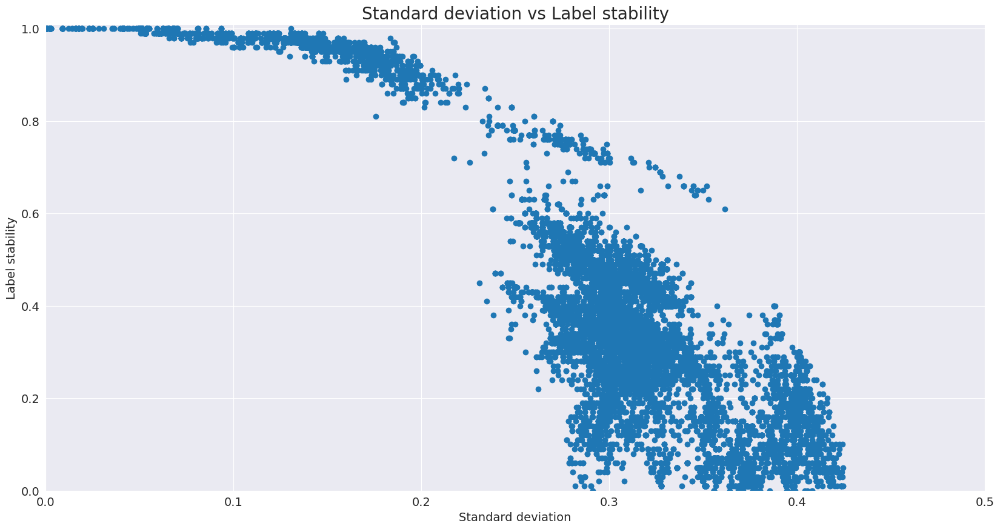

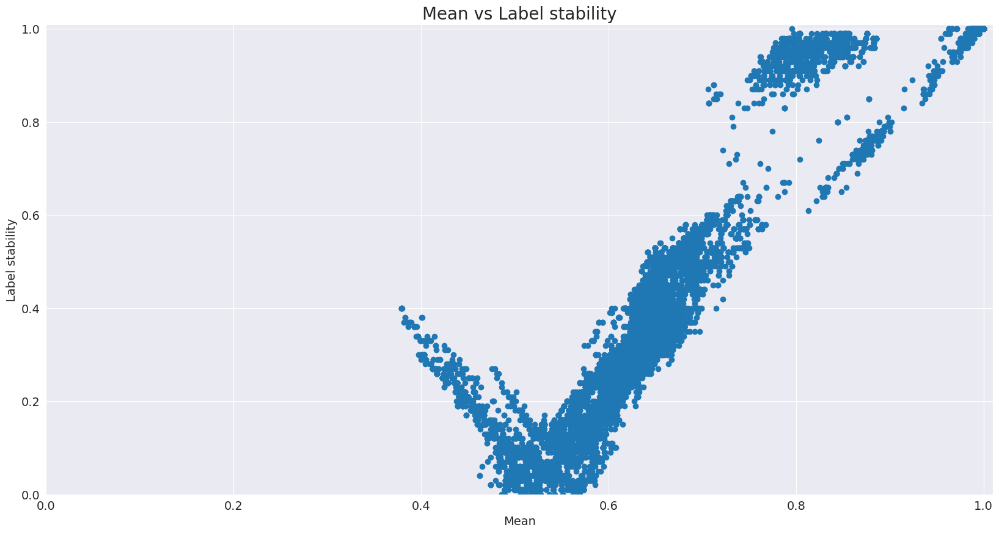

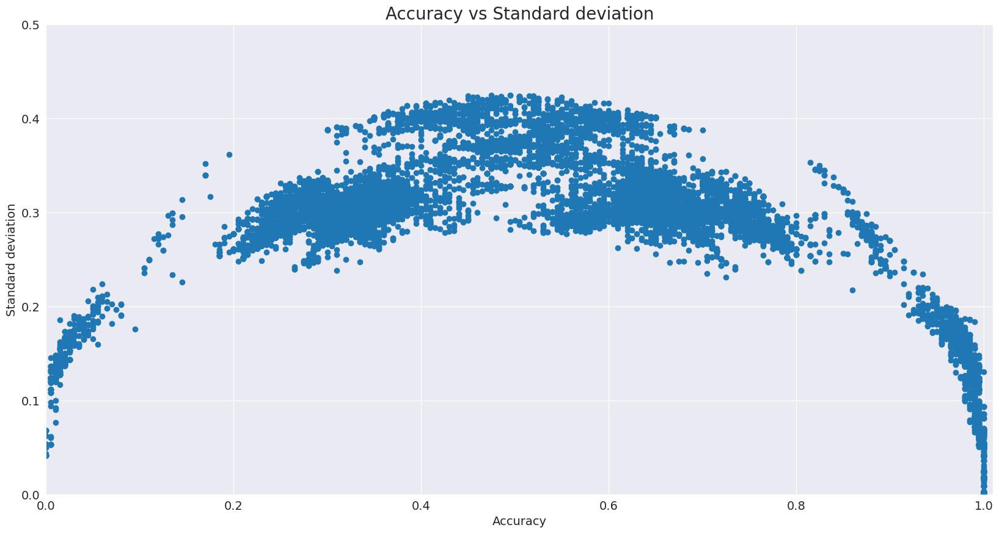

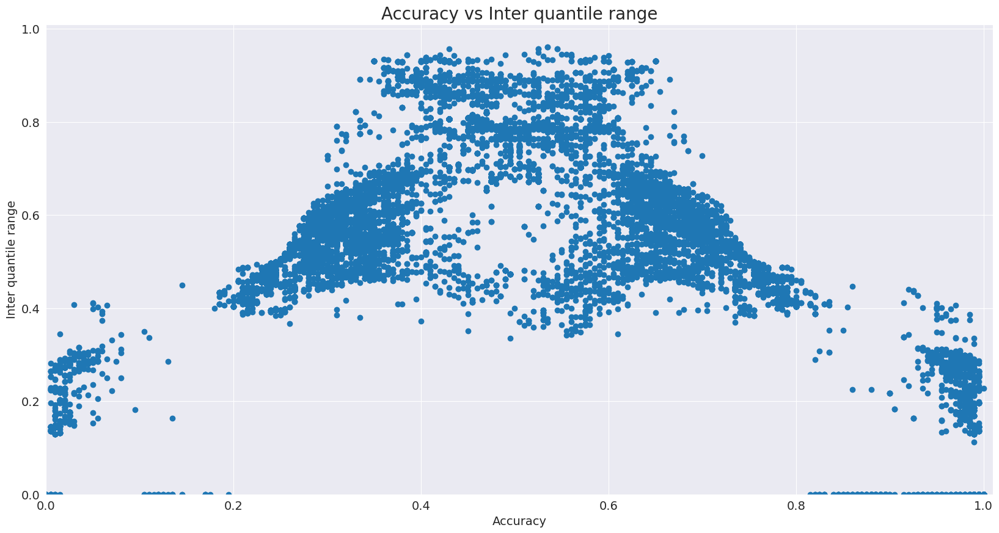

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.517981  0.505673  0.486552
disadv    0.583643  0.552510  0.561633
Accuracy -0.065662 -0.046837 -0.075081

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.029740  0.034724  0.038939
disadv            0.014044  0.019648  0.013482
Disparate_Impact  0.472226  0.565847  0.346241

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.020557  0.028864  0.028210
disadv             0.015423  0.013190  0.013239
Equal_Opportunity  0.005134  0.015674  0.014971

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.063051  0.071190  0.077432
disadv             

In [90]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-trimmed')

### Impute-by-mean-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


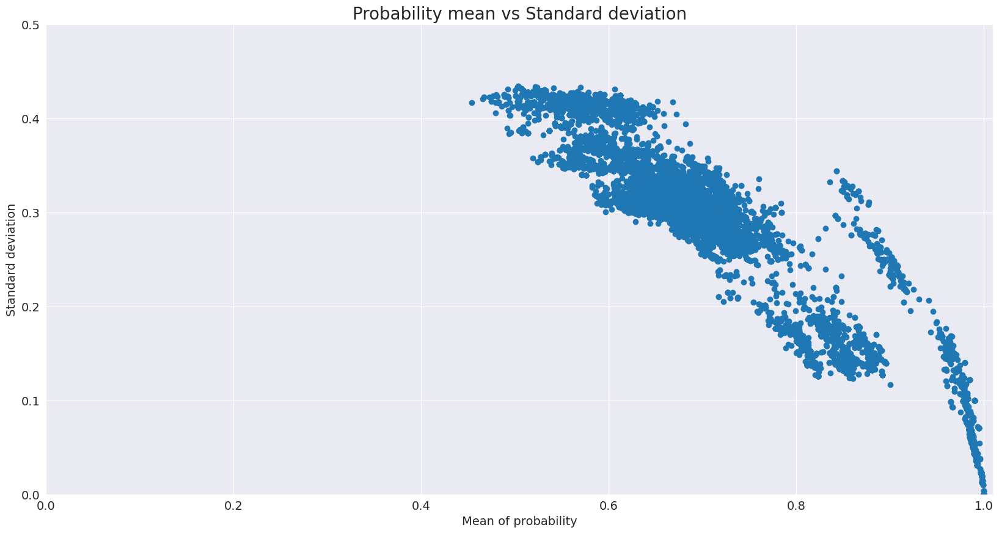

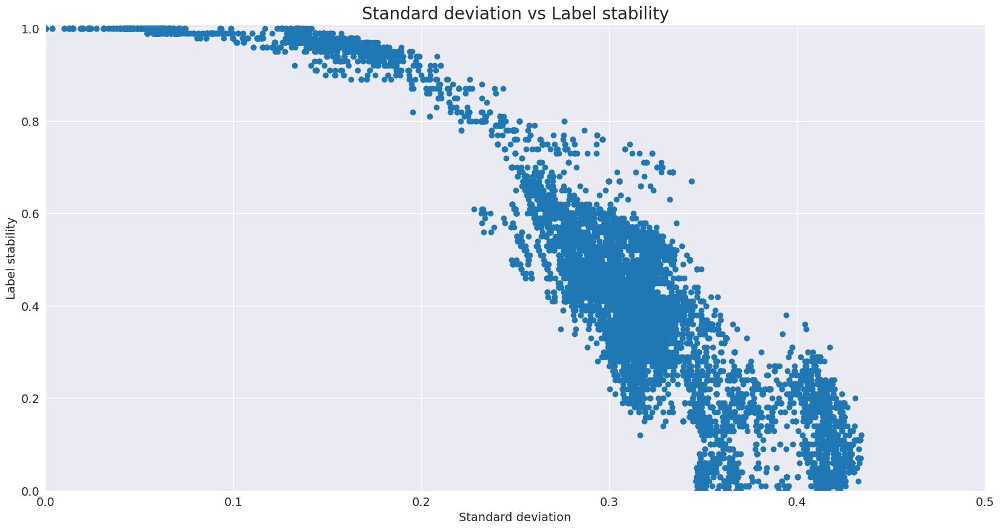

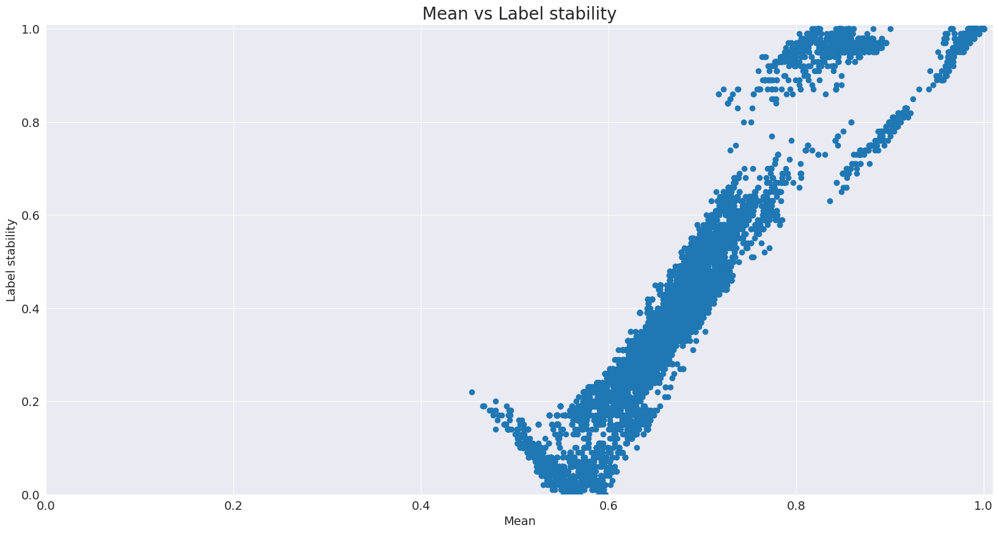

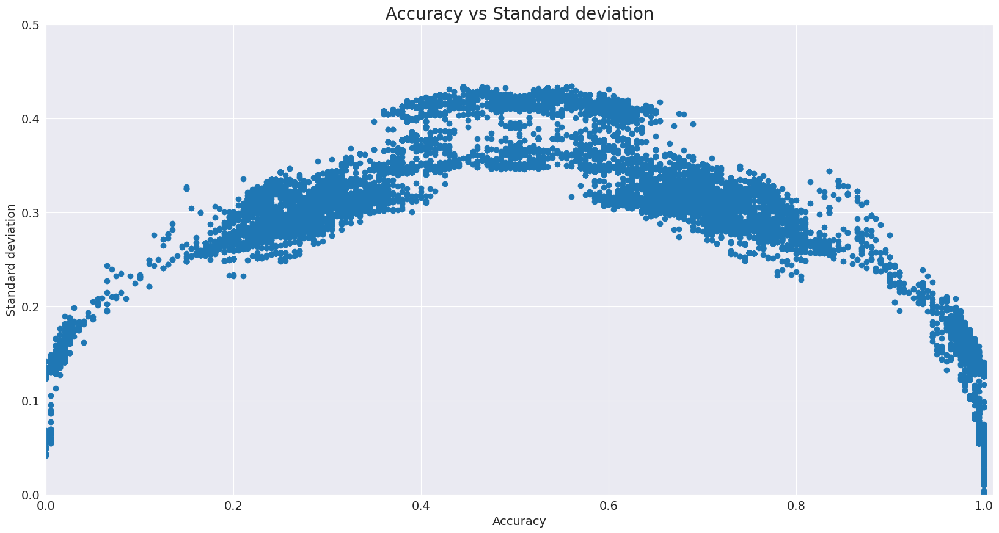

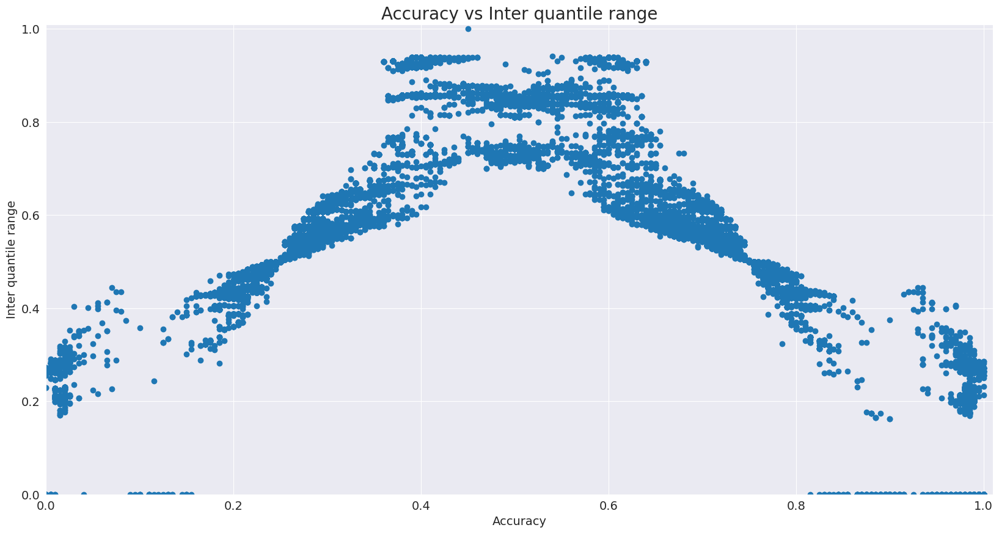

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527677  0.511452  0.496084
disadv    0.584882  0.560222  0.563559
Accuracy -0.057205 -0.048770 -0.067475

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000868  0.001523   0.00133
disadv            0.000000  0.000639   0.00000
Disparate_Impact  0.000000  0.419166   0.00000

#################### Equal_Opportunity ####################
                      Race       Sex  Race_Sex
adv                0.00023  0.000754  0.000294
disadv             0.00000  0.000335  0.000000
Equal_Opportunity  0.00023  0.000419  0.000294

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001841  0.003123  0.002645
disadv                 

In [91]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_SEX')

### Impute-by-mean-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


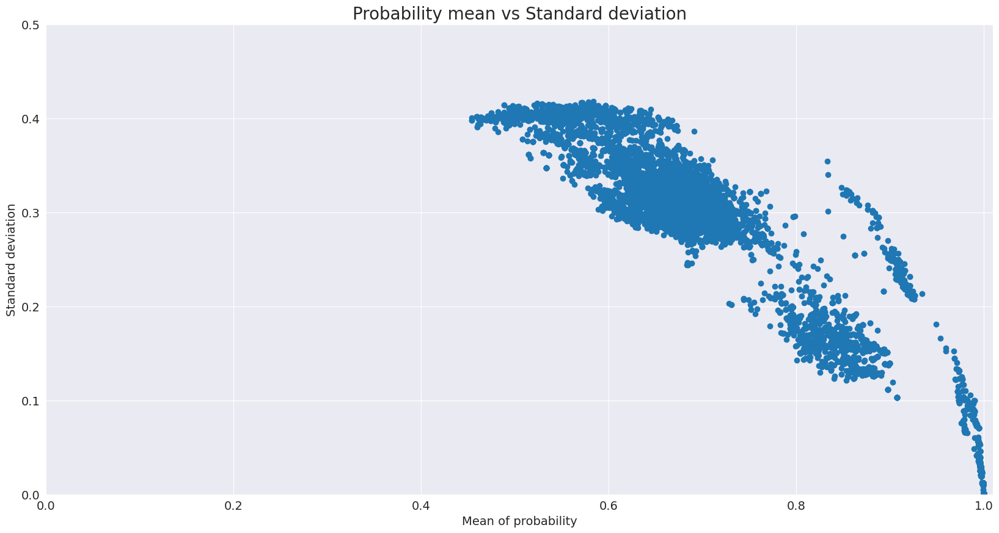

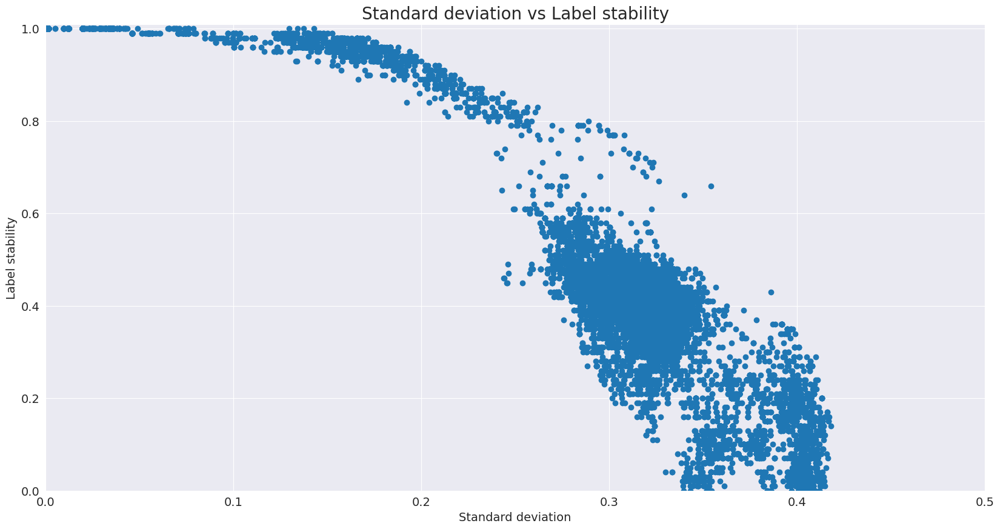

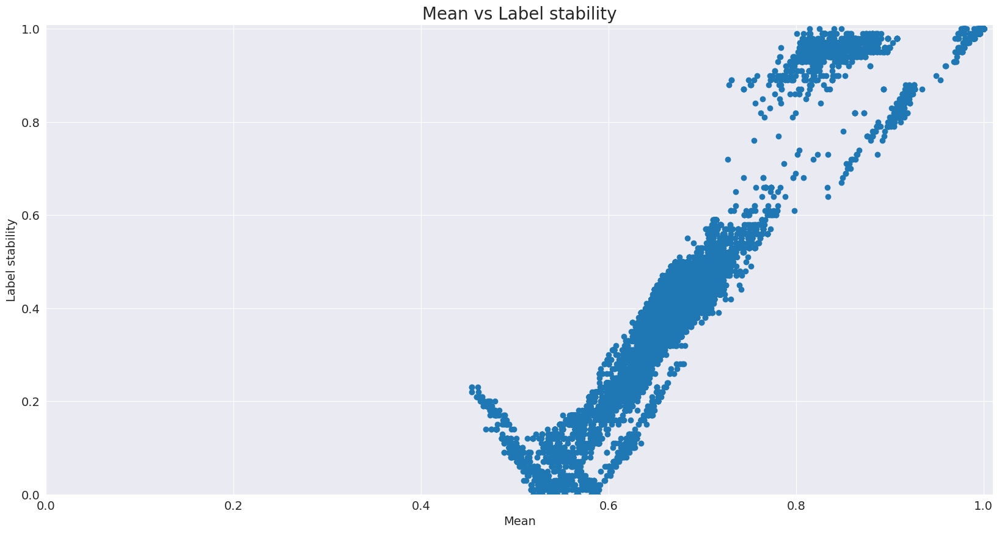

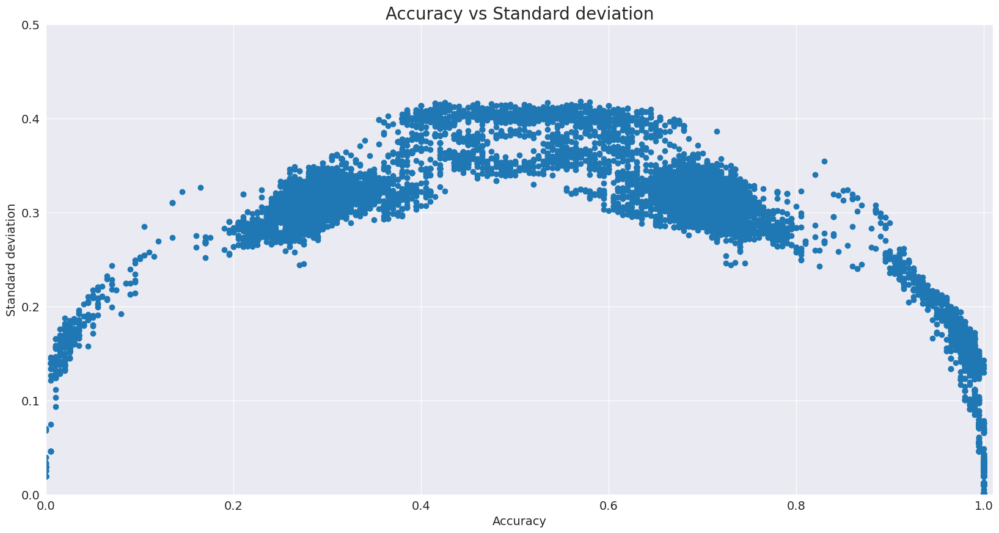

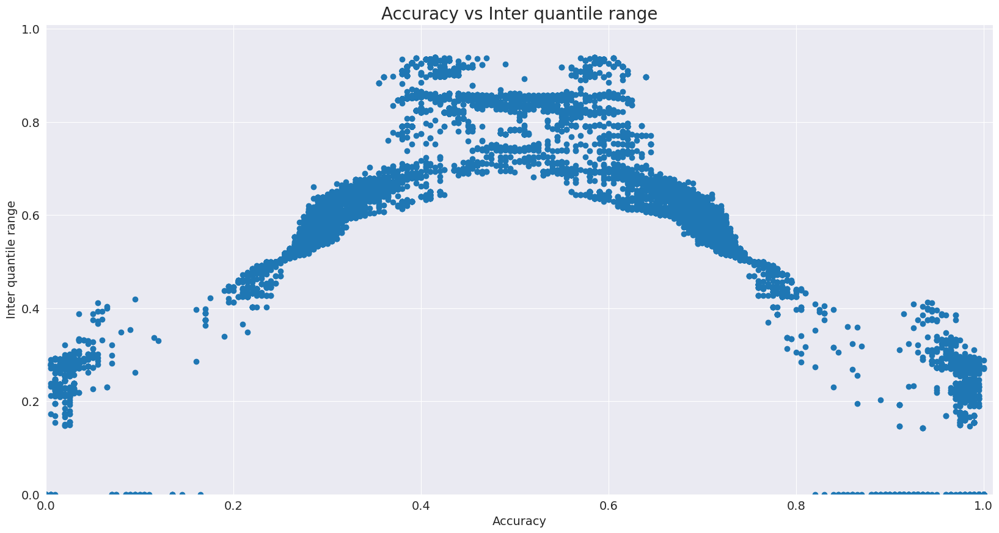

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.525977  0.510296  0.495123
disadv    0.584676  0.558699  0.563559
Accuracy -0.058699 -0.048403 -0.068436

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.006910  0.006777  0.007463
disadv            0.001033  0.005502  0.001541
Disparate_Impact  0.149434  0.811837  0.206471

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.004832  0.004954  0.005436
disadv             0.000995  0.004136  0.001765
Equal_Opportunity  0.003837  0.000818  0.003671

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.014651  0.013893  0.014840
disadv             

In [92]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_RAC1P')

### Impute-by-median technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


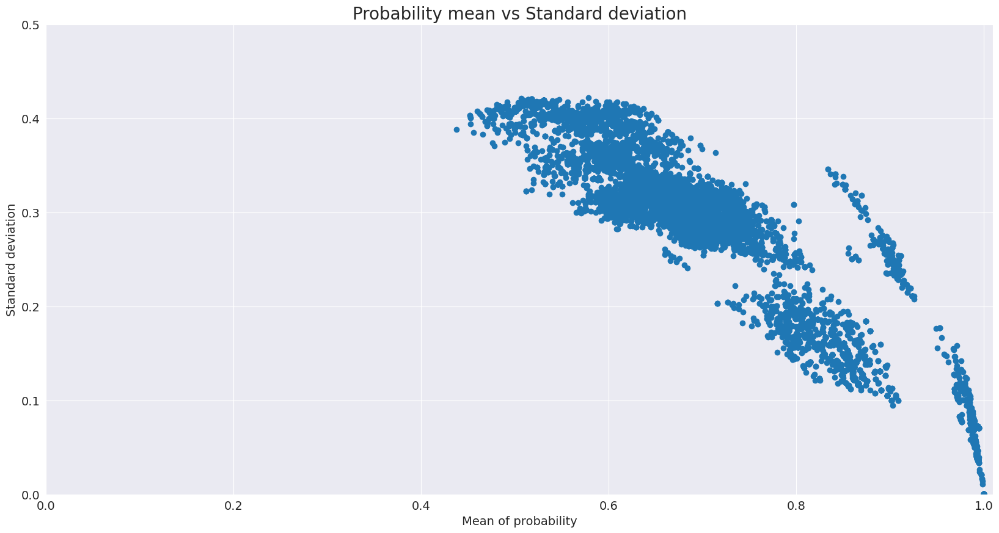

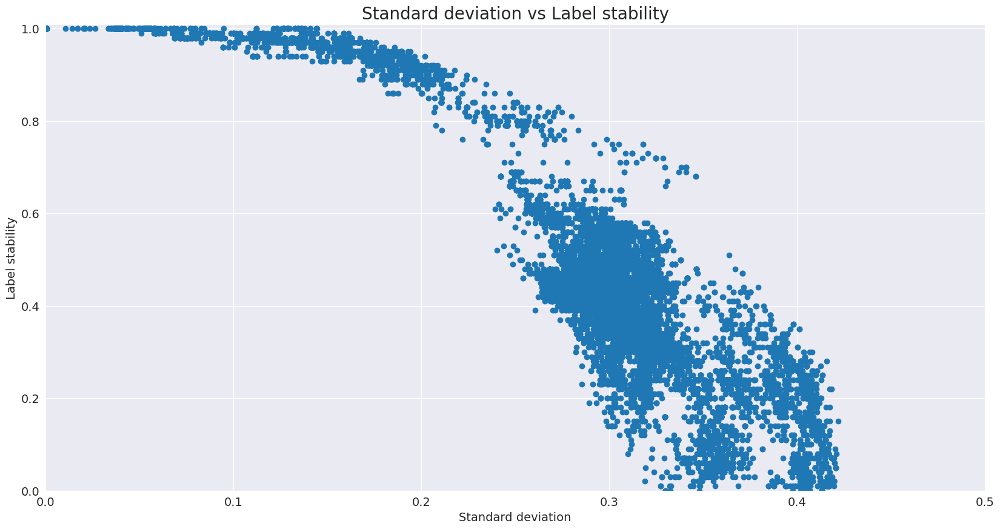

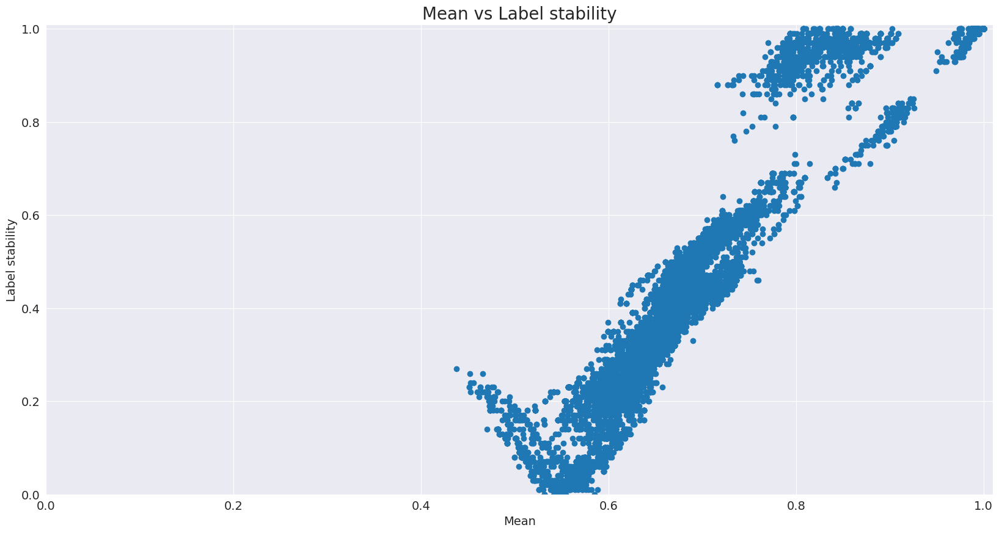

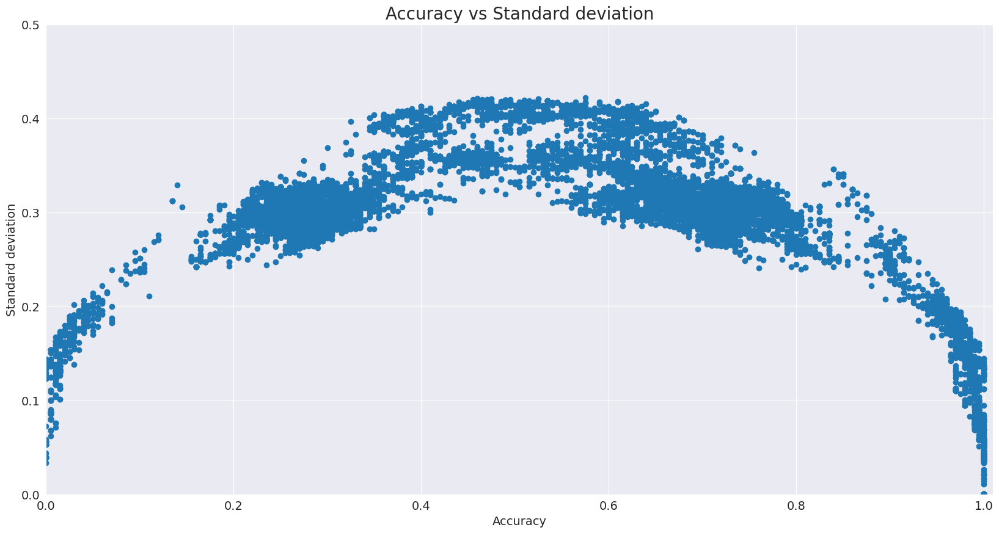

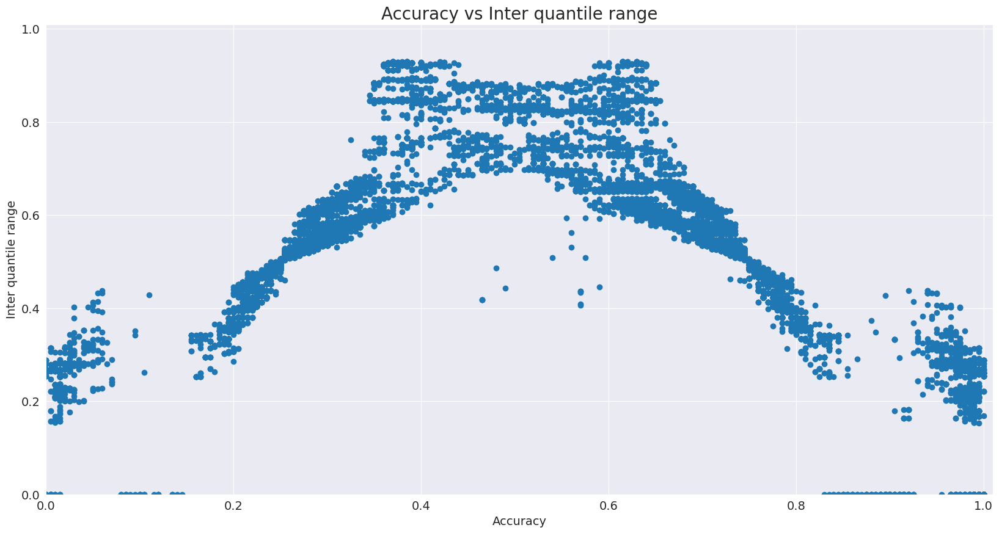

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527026  0.510769  0.495788
disadv    0.584676  0.559338  0.563559
Accuracy -0.057650 -0.048569 -0.067771

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.003907  0.004308  0.004138
disadv            0.001033  0.003389  0.000770
Disparate_Impact  0.264277  0.786821  0.186193

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.002761  0.002908  0.002792
disadv             0.000995  0.002459  0.000883
Equal_Opportunity  0.001766  0.000449  0.001909

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.008284  0.008831  0.008228
disadv             

In [93]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median')

### Impute-by-median-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


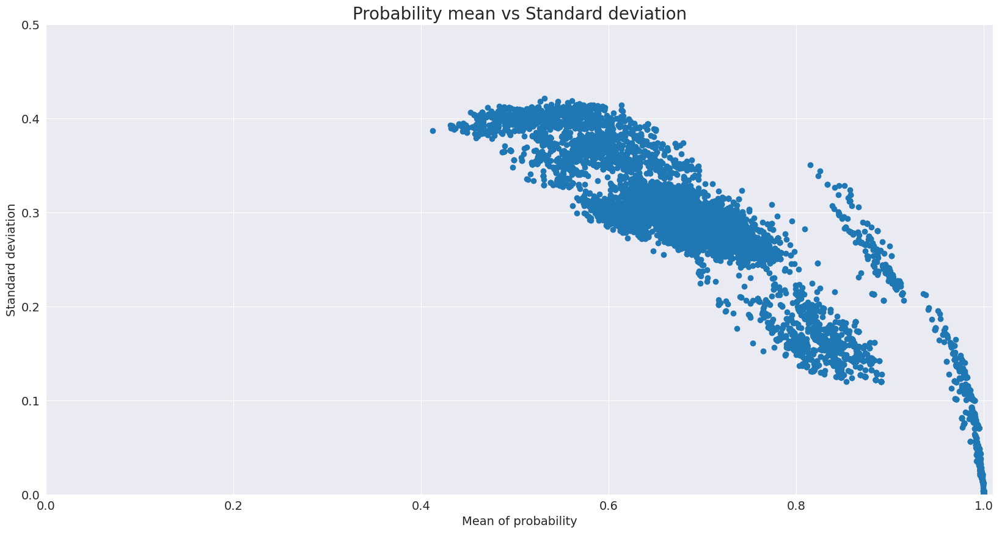

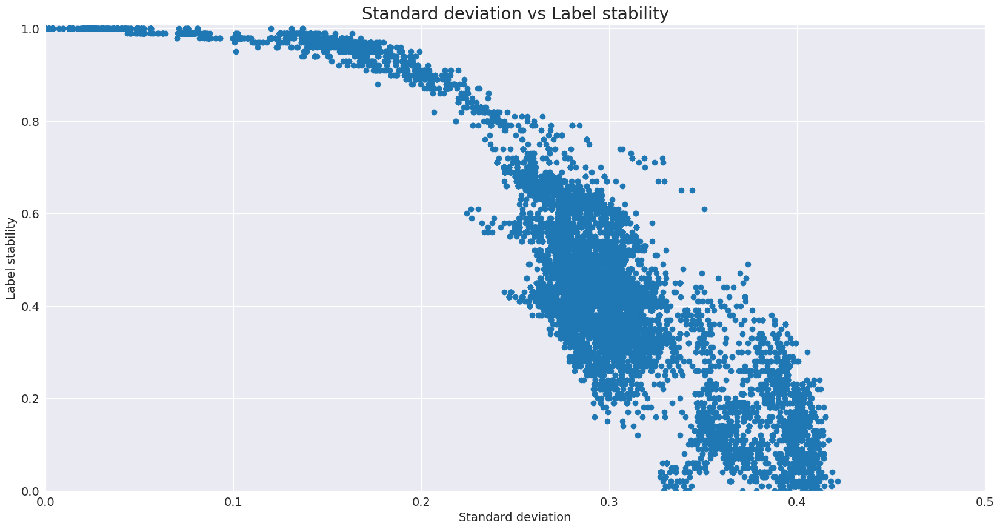

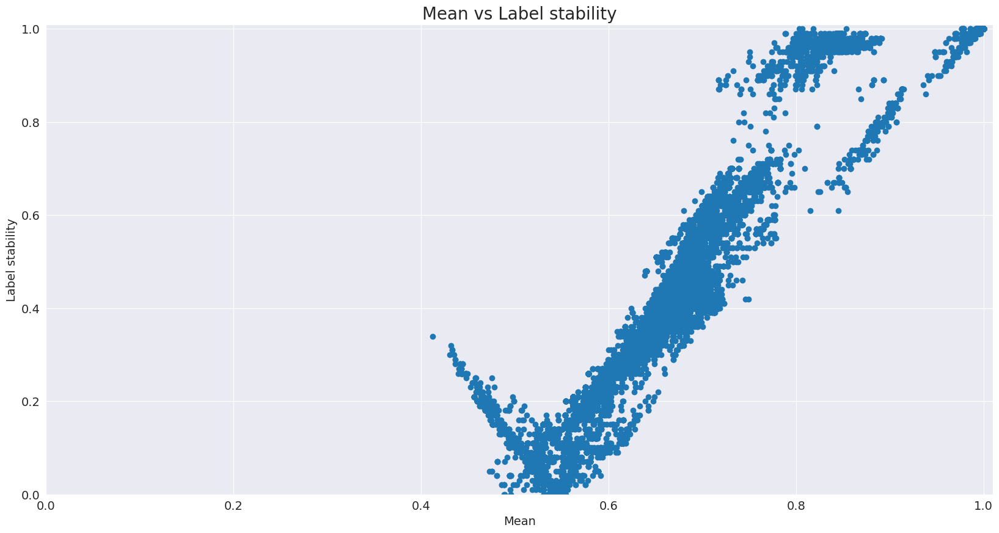

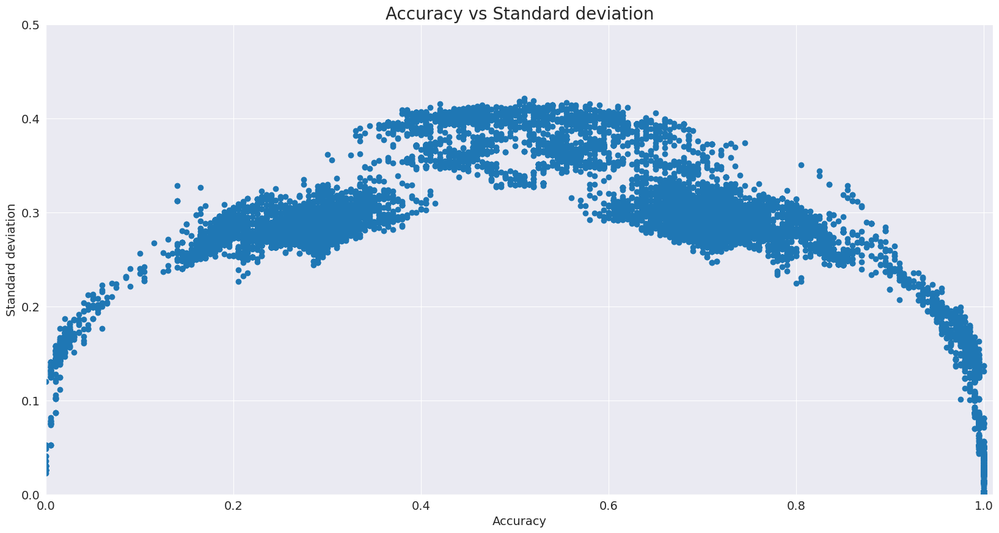

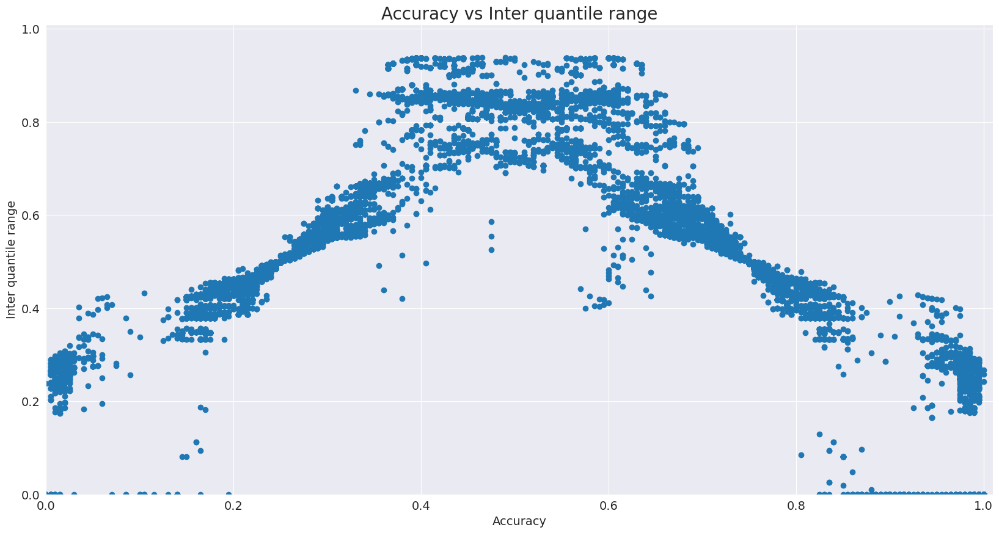

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.523155  0.507985  0.491798
disadv    0.584469  0.556931  0.563174
Accuracy -0.061314 -0.048946 -0.071376

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.018632  0.018754  0.023201
disadv            0.002478  0.011494  0.002696
Disparate_Impact  0.133011  0.612898  0.116222

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.014267  0.014863  0.017778
disadv             0.002488  0.008943  0.002648
Equal_Opportunity  0.011780  0.005920  0.015131

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.039503  0.038449  0.046136
disadv             

In [94]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-trimmed')

### Impute-by-median-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


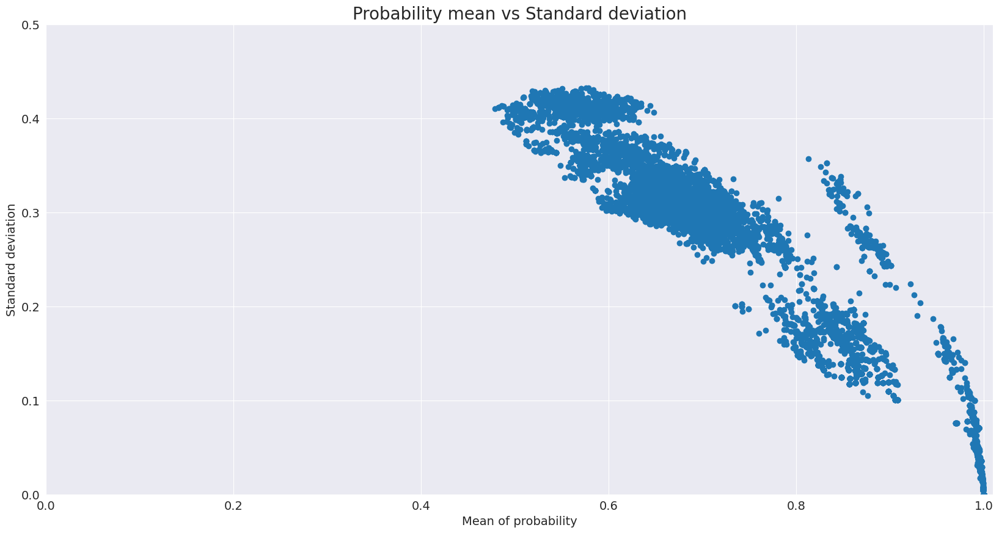

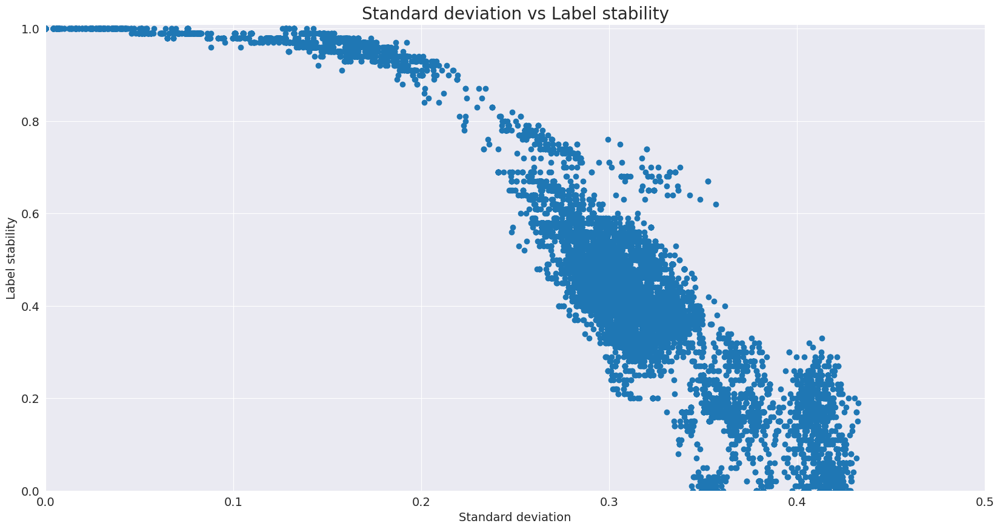

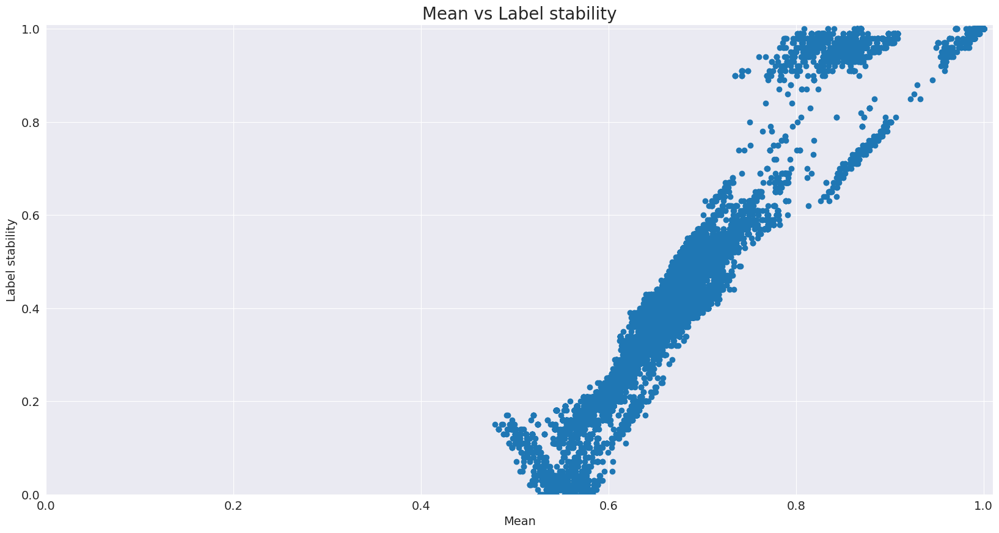

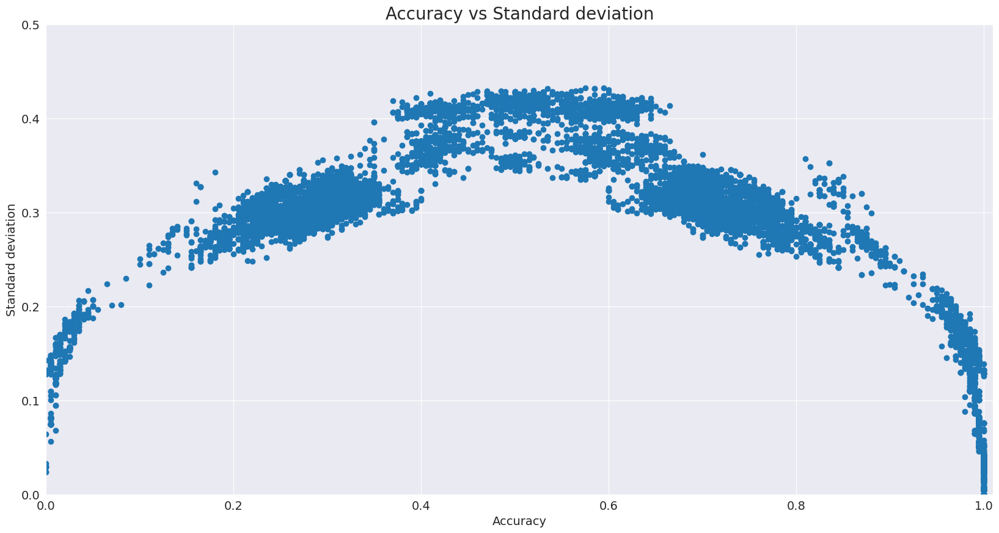

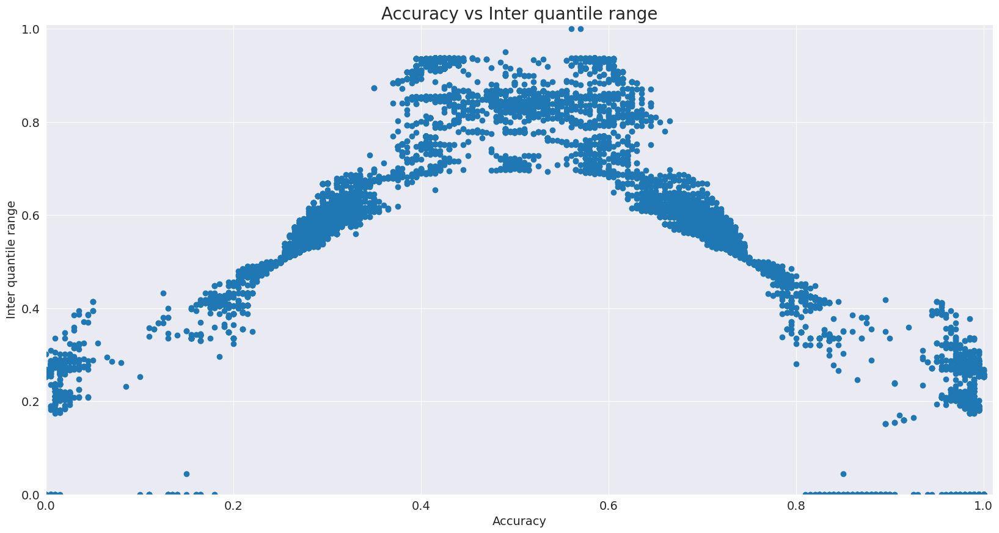

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527858  0.511715  0.496749
disadv    0.585089  0.560075  0.563559
Accuracy -0.057231 -0.048360 -0.066810

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000687  0.000630  0.000369
disadv            0.000207  0.001179  0.000000
Disparate_Impact  0.300441  1.870125  0.000000

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.000230  0.000108       0.0
disadv             0.000498  0.000782       0.0
Equal_Opportunity -0.000267 -0.000675       0.0

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001457  0.001292  0.000735
disadv             

In [95]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_SEX')

### Impute-by-median-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


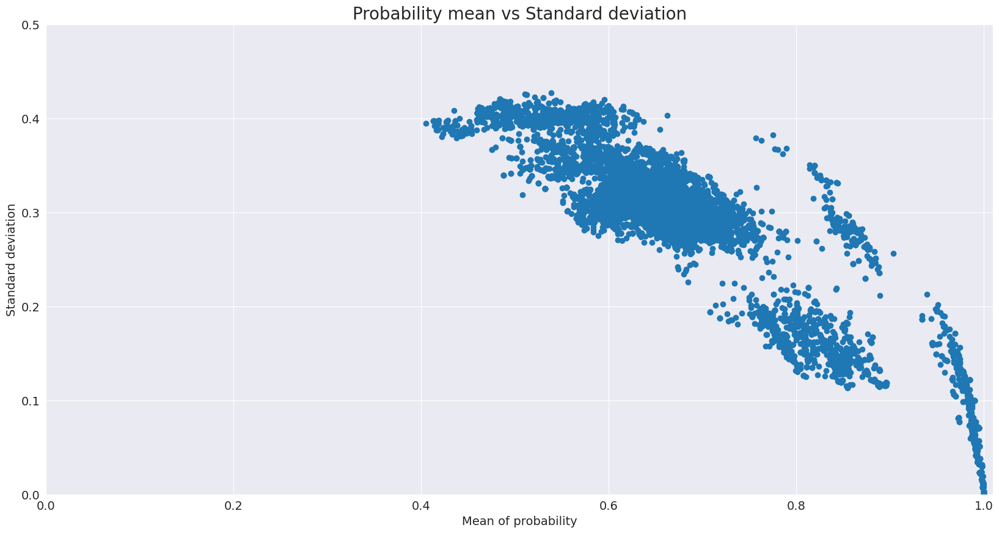

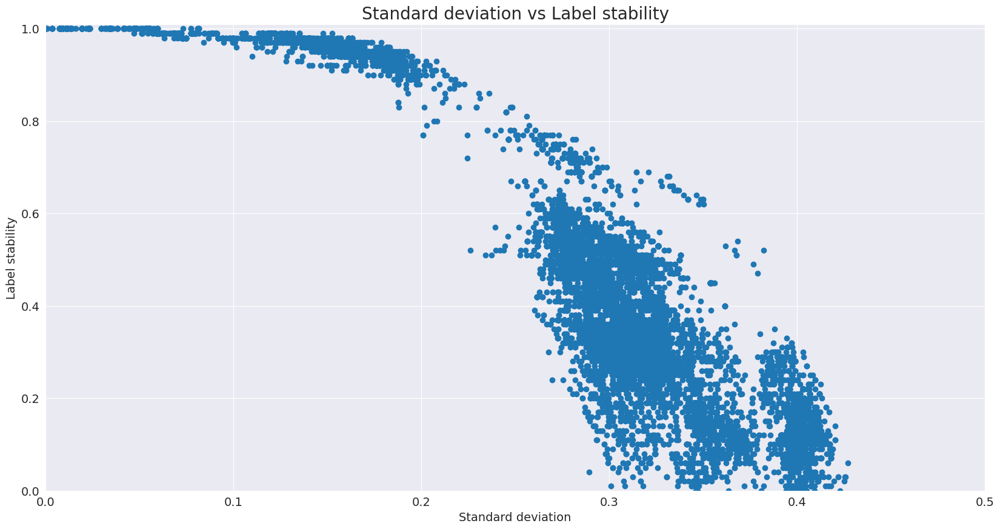

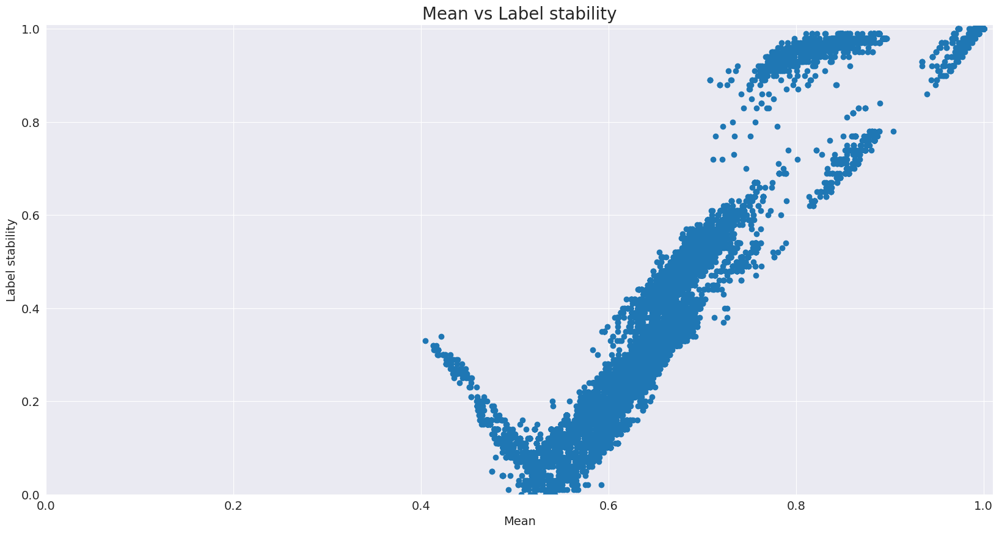

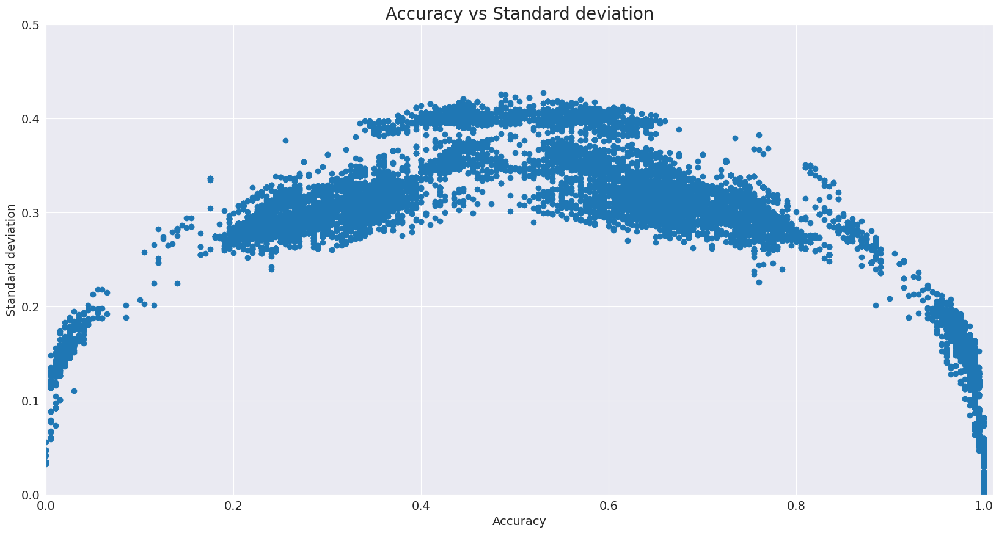

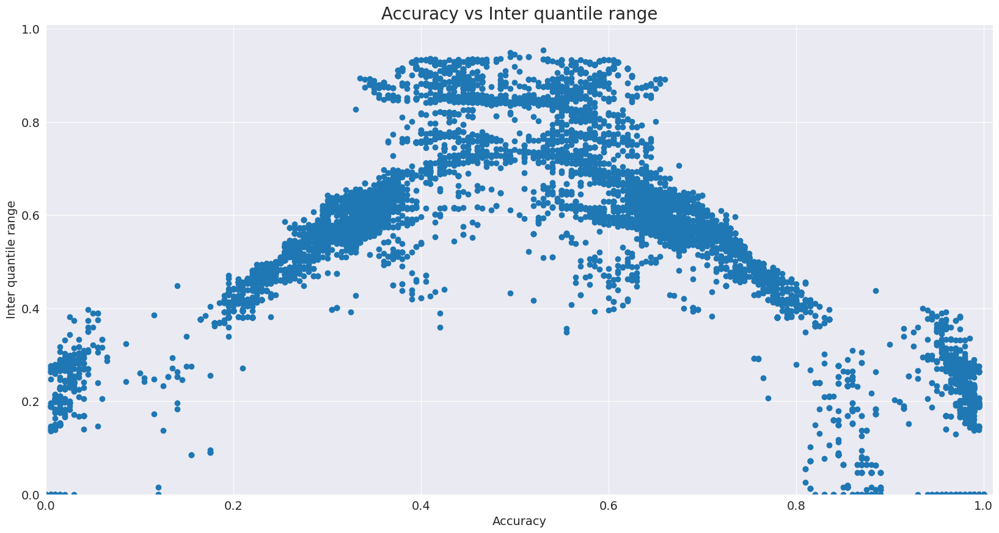

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520116  0.503940  0.486700
disadv    0.583643  0.555801  0.562404
Accuracy -0.063527 -0.051861 -0.075704

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.020297  0.020698  0.025787
disadv            0.004131  0.012526  0.005008
Disparate_Impact  0.203507  0.605180  0.194196

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.012810  0.012709  0.015281
disadv             0.003483  0.008831  0.004413
Equal_Opportunity  0.009327  0.003878  0.010868

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.043031  0.042434  0.051278
disadv             

In [96]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_RAC1P')

## Display result plots

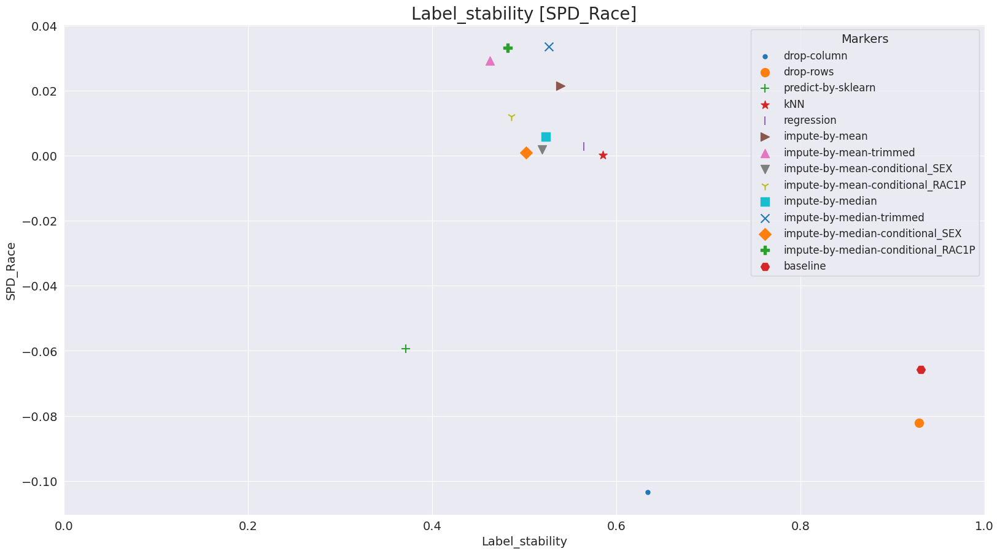

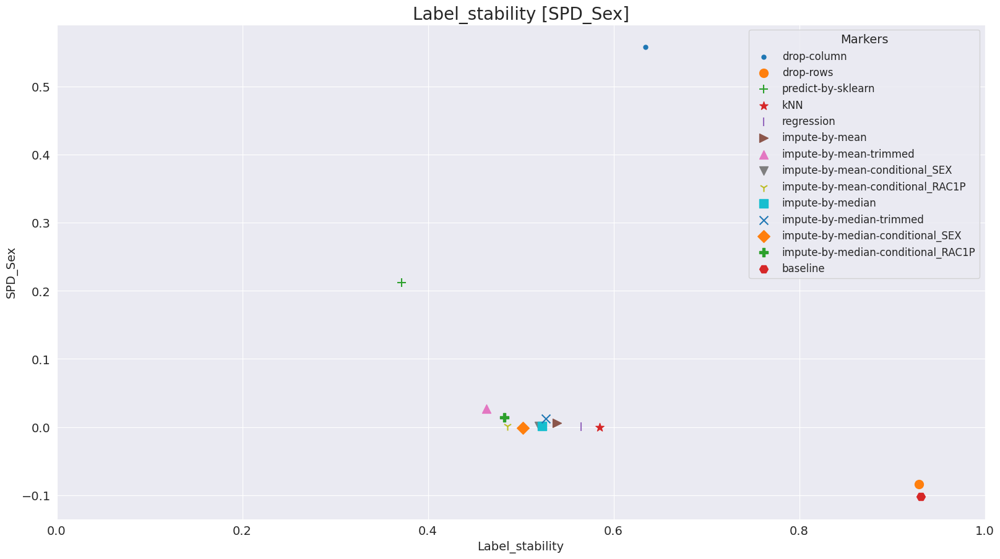

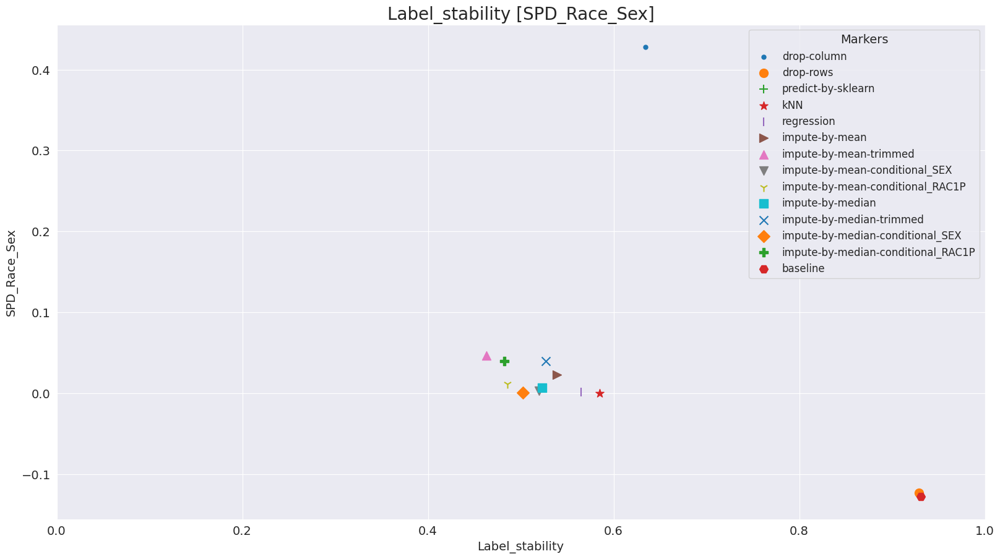

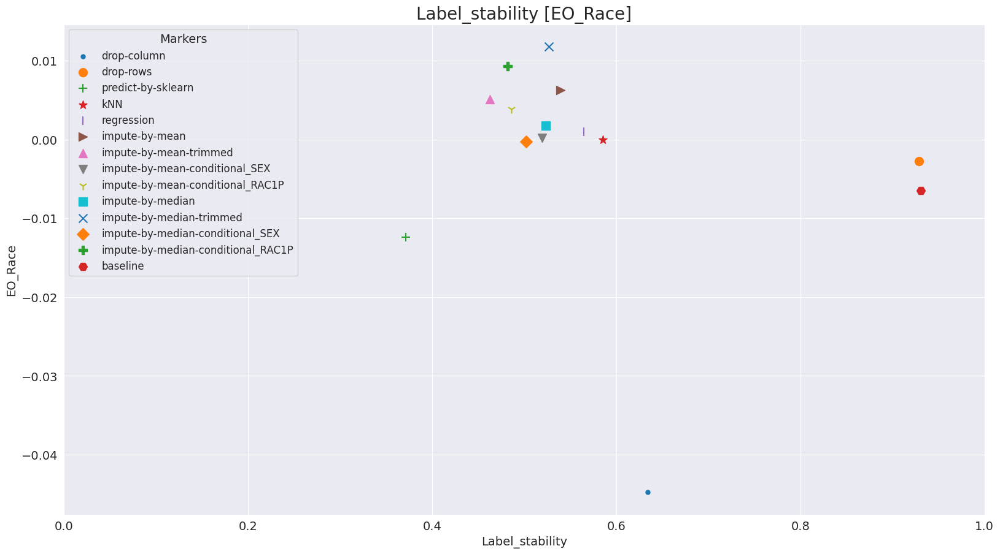

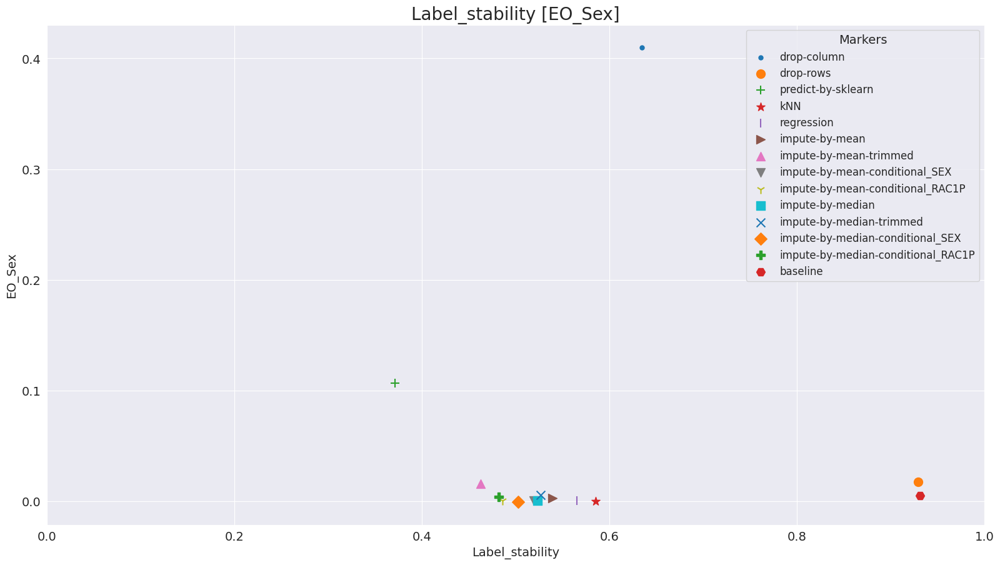

...

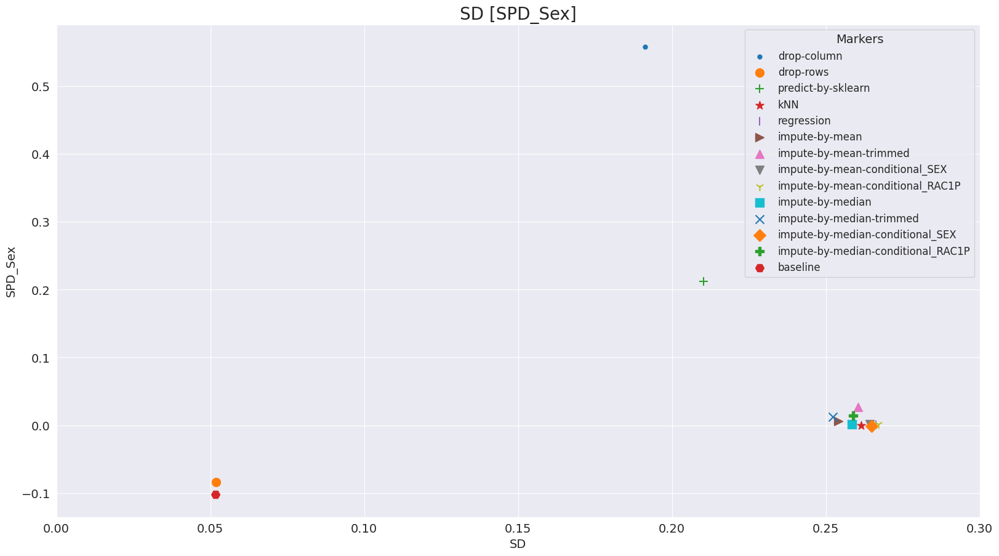

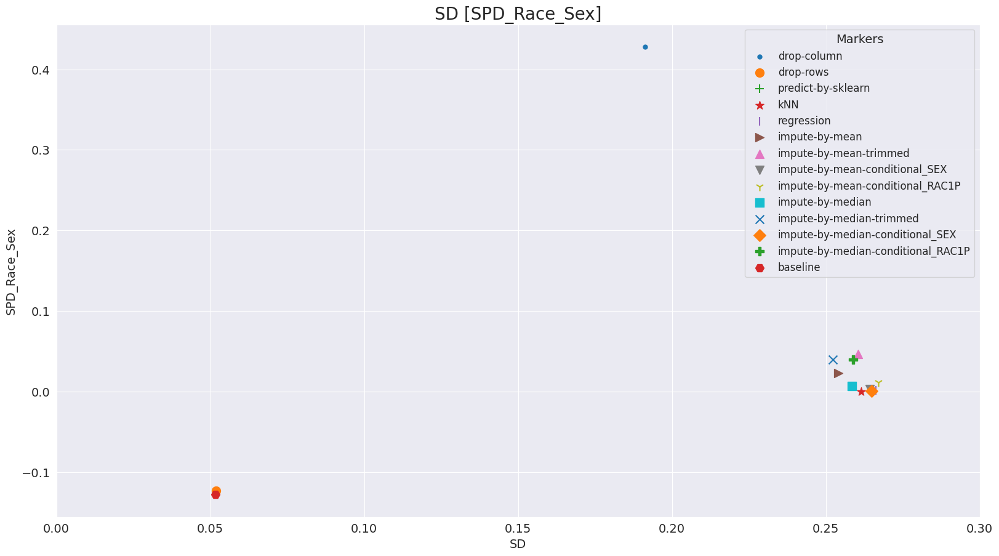

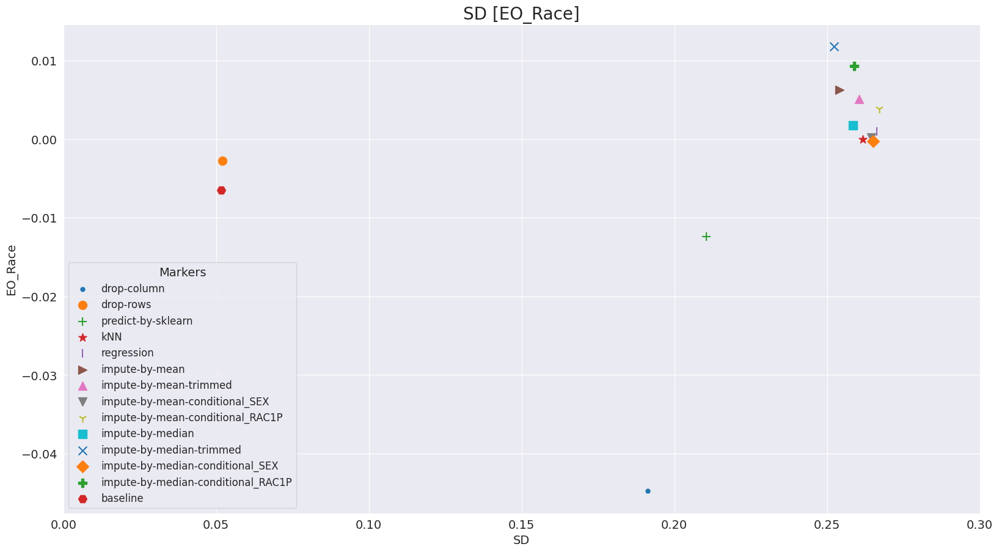

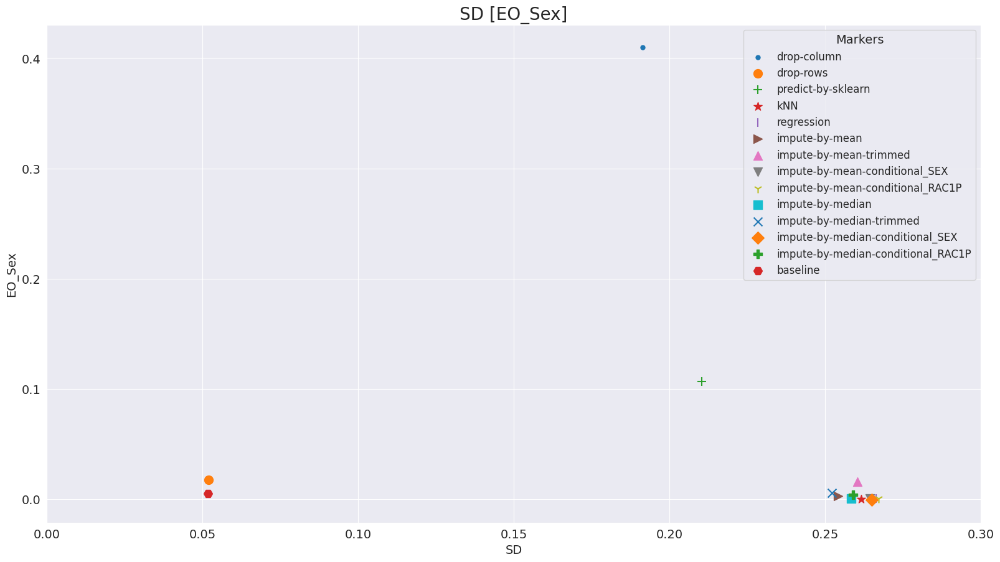

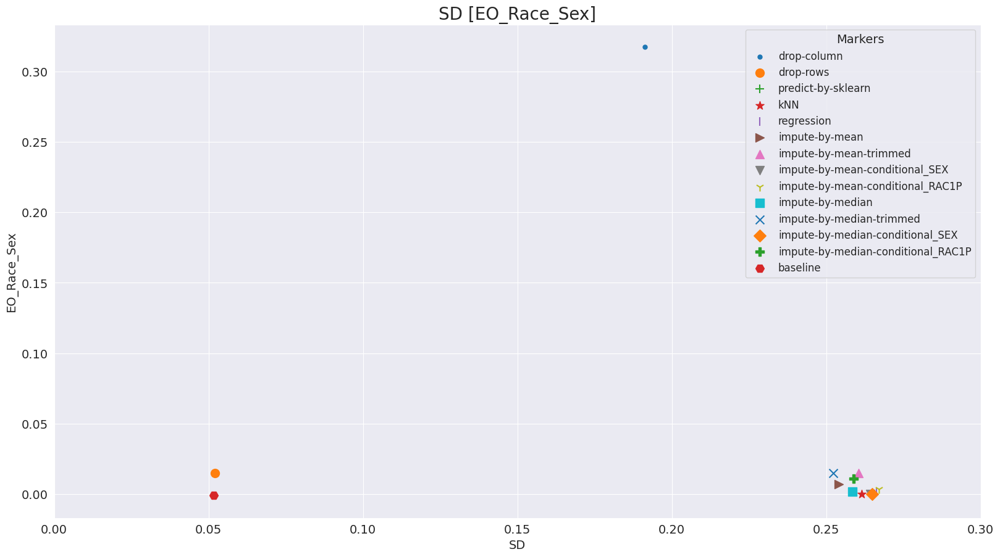

In [97]:
display_result_plots(NULL_SCENARIO_NAME, imputation_techniques)